In [1]:
%load_ext autoreload
%autoreload 2

In [5]:
import sys
import pickle,itertools
import requests, json
import copy
import os

import networkx as nx
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import matplotlib as mpl
import pypsa
import cartopy.crs as ccrs 
import cartopy
import cartopy.geodesic as gd
from shapely.geometry import Point

import matplotlib.colors as mplcolors
from matplotlib.gridspec import GridSpec
from tqdm import tqdm

#date_string = datetime.datetime.now().strftime("%I_%M_%B_%d")

path = '/media/fkaiser/'

save_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'

path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'

sys.path.append(path+'Code/power-system-split/power_system_split/')
import utils,visualisation

In [162]:
colors ={
    "onwind" : "#235ebc",
    'offwind' : "#6895dd",
    'offwind-ac' : "#6895dd",
    'offwind-dc' : "#74c6f2",
    "ror" : "#4adbc8",
    'solar' : "#f9d002",
    "OCGT" : "#d35050",
    "CCGT" : "#b20101",
    "Nuclear" : "#ff9000",
    "nuclear" : "#ff9000",
    "coal" : "#707070",
    "lignite" : "#9e5a01",
    "biomass" : '#0c6013',
    'geothermal' : '#ba91b1',
    "oil" : "#262626"}


    

    
    
#    "onwind" : "#235ebc"
#    "onshore wind" : "#235ebc"
#    'offwind' : "#6895dd"
#    'offwind-ac' : "#6895dd"
#    'offshore wind' : "#6895dd"
#    'offshore wind ac' : "#6895dd"
#    'offwind-dc' : "#74c6f2"
#    'offshore wind dc' : "#74c6f2"
#    "hydro" : "#08ad97"
#    "hydro+PHS" : "#08ad97"
#    "PHS" : "#08ad97"
#    "hydro reservoir" : "#08ad97"
#    'hydroelectricity' : '#08ad97'
#    "ror" : "#4adbc8"
#    "run of river" : "#4adbc8"
#    'solar' : "#f9d002"
#    'solar PV' : "#f9d002"
#    'solar thermal' : '#ffef60'
#    'solid biomass' : '#06540d'
#    'biogas' : '#23932d'
#    'waste' : '#68896b'
#    'geothermal' : '#ba91b1'
#    "OCGT" : "#d35050"
#    "OCGT marginal" : "#d35050"
#    "OCGT-heat" : "#d35050"
#    "gas boiler" : "#d35050"
#    "gas boilers" : "#d35050"
#    "gas boiler marginal" : "#d35050"
#    "gas-to-power/heat" : "#d35050"
#    "gas" : "#d35050"
#    "natural gas" : "#d35050"
#    "CCGT" : "#b20101"
#    "CCGT marginal" : "#b20101"
#    "Nuclear" : "#ff9000"
#    "Nuclear marginal" : "#ff9000"
#    "nuclear" : "#ff9000"
#    "coal" : "#707070"
#    "Coal" : "#707070"
#    "Coal marginal" : "#707070"
#    "lignite" : "#9e5a01"
#    "Lignite" : "#9e5a01"
#    "Lignite marginal" : "#9e5a01"
#    "Oil" : "#262626"
#    "oil" : "#262626"
#    "H2" : "#ea048a"
#    "hydrogen storage" : "#ea048a"
#    "Sabatier" : "#a31597"
#    "methanation" : "#a31597"
#    "helmeth" : "#a31597"
#    "DAC" : "#d284ff"
#    "co2 stored" : "#e5e5e5"
#    "CO2 sequestration" : "#e5e5e5"
#    "battery" : "#b8ea04"
#    "battery storage" : "#b8ea04"
#    "Li ion" : "#b8ea04"
#    "BEV charger" : "#e2ff7c"
#    "V2G" : "#7a9618"
#    "transport fuel cell" : "#e884be"
#    "retrofitting" : "#e0d6a8"
#    "building retrofitting" : "#e0d6a8"
#    "heat pumps" : "#ff9768"
#    "heat pump" : "#ff9768"
#    "air heat pump" : "#ffbea0"
#    "ground heat pump" : "#ff7a3d"
#    "power-to-heat" : "#a59e7c"
#    "power-to-gas" : "#db8585"
#    "power-to-liquid" : "#a9acd1"
#    "Fischer-Tropsch" : "#a9acd1"
#    "resistive heater" : "#aa4925"
#    "water tanks" : "#401f75"
#    "hot water storage" : "#401f75"
#    "hot water charging" : "#351c5e"
#    "hot water discharging" : "#683ab2"
#    "CHP" : "#d80a56"
#    "CHP heat" : "#d80a56"
#    "CHP electric" : "#d80a56"
#    "district heating" : "#93864b"
#    "Ambient" : "#262626"
#    "Electric load" : "#f9d002"
#    "electricity" : "#f9d002"
#    "Heat load" : "#d35050"
#    "heat" : "#d35050"
#    "Transport load" : "#235ebc"
#    "transport" : "#235ebc"
#    "lines" : "#70af1d"
#    "transmission lines" : "#70af1d"
#    "AC-AC" : "#70af1d"
#    "AC line" : "#70af1d"
#    "links" : "#8a1caf"
#    "HVDC links" : "#8a1caf"
#    "DC-DC" : "#8a1caf"
#    "DC link" : "#8a1caf"    

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/xarray/backends/plugins.py:61: RuntimeWarning: Engine 'cfgrib' loading failed:
Cannot find the ecCodes library
  warnings.warn(f"Engine {name!r} loading failed:\n{ex}", RuntimeWarning)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, car

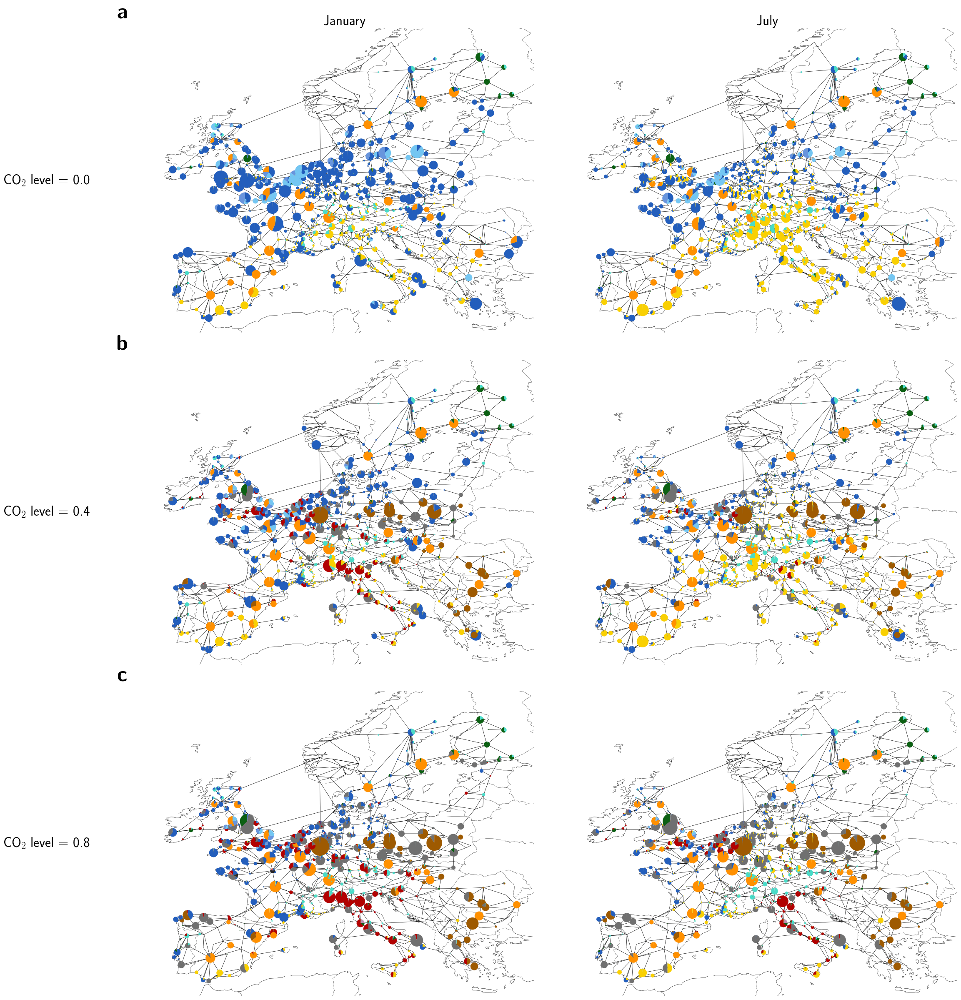

In [4]:
mpl.style.use('default')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}\usepackage{bm}')

target_levels = [0.0,0.40,0.80]

f,ax = plt.subplots(3,2,figsize = (24,24),subplot_kw = {"projection":ccrs.PlateCarree()})
vmax = 3.2e2
months = [1,7]

labels = [[r'\textbf{a}',r'\textbf{b}',r'\textbf{c}'],[r'\textbf{c}','',r'\textbf{d}','','']]

for i,ind in enumerate(target_levels):
    
    n = pypsa.Network()
    n.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{ind}-3H.nc')
    
    for j,month in enumerate(months):
        
        ax[i,j].set_ylim([0,vmax])
        current_snapshots = n.snapshots[n.snapshots.month == month]

        
        n.plot(bus_sizes = n.generators_t.p.loc[current_snapshots].sum().groupby([n.generators["bus"],n.generators["carrier"]]).sum()/2e6,
               line_colors = 'black',
               link_colors = 'black', 
               link_widths = 0.5,
               line_widths = 0.5,
               ax = ax[i,j])
        
        
        
        if i == 0:
            ax[i,j].set_title(current_snapshots.month_name()[0], fontsize = 24)
        if j == 0:
            ax[i,j].text(0- 0.1, 1+0.05, 
                         labels[j][i],
                         fontsize = 36,
                         weight = 'bold',
                         verticalalignment = 'center',
                         transform = ax[i,j].transAxes)
            
            ax[i,j].text(0- 0.4, 0.5, 
                        r'CO$_2$ level = '+str(ind),
                        fontsize = 24,
                        verticalalignment = 'center',
                        transform = ax[i,j].transAxes)
plt.tight_layout()
plt.savefig(save_path+'Figures/Generation_mix_versus_co2level.pdf',bbox_inches='tight')
#plt.savefig(save_path+'Figures/SI_Pypsa_illustration_networks.png',bbox_inches='tight')
plt.show()

In [183]:
carrier_types = ['CCGT', 'OCGT', 'biomass', 'coal', 'geothermal', 'lignite', 'nuclear',
                 'offwind-ac', 'offwind-dc', 'oil', 'onwind', 'ror', 'solar'],
generation_by_carrier_and_co2l = pd.DataFrame(index = pd.Index(*carrier_types),
                                   columns = ['{0:.2f}'.format(co2l) for i,co2l in enumerate(co2ls)])

for i,level in enumerate(co2ls):
    n = pypsa.Network()
    co2lstr = '{0:.2f}'.format(level)
    level = np.round(level,2)
    n.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')
    generation_by_carrier_and_co2l[co2lstr] = n.generators_t.p.T.groupby(n.generators["carrier"]).sum().sum(axis=1)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.5-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

[ 0  1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19]


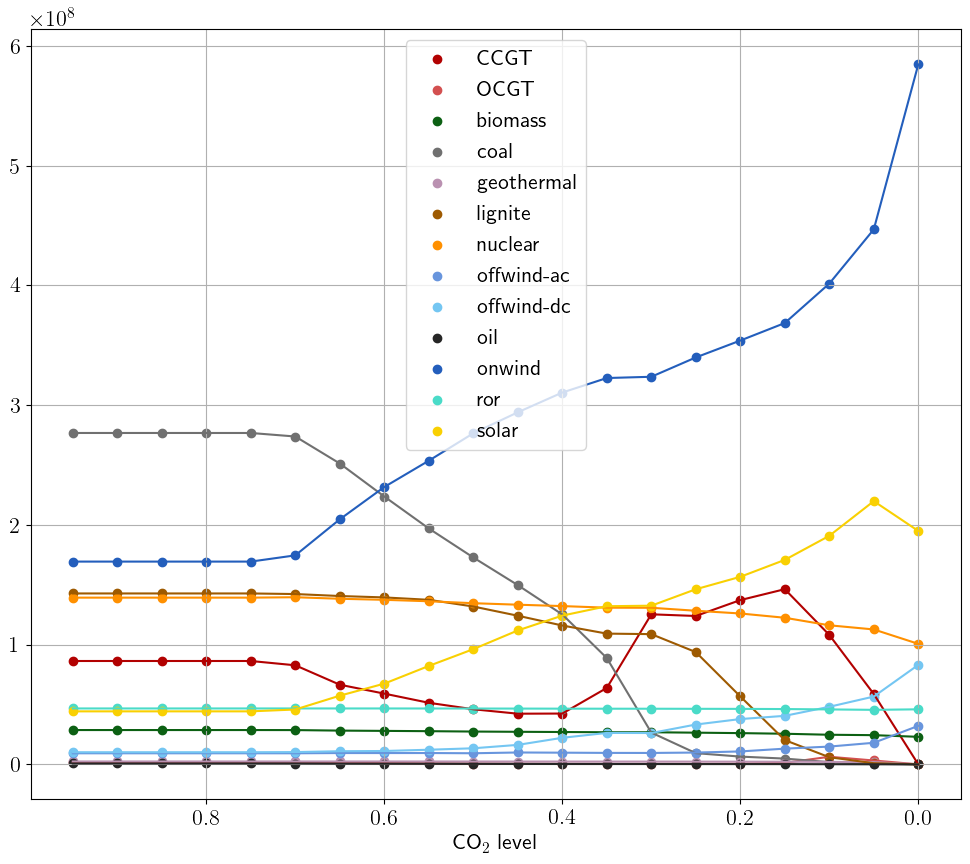

In [194]:
f,ax = plt.subplots(figsize = (12,10))
co2s = generation_by_carrier_and_co2l.columns.astype('float')
index = np.argsort(co2s)
print(index)

for row in generation_by_carrier_and_co2l.iterrows():
    ax.scatter(co2s[index],
               (row[1].values)[index],
               color = colors[row[0]],
               label = row[0])
    ax.plot(co2s[index],
            (row[1].values)[index],
            color = colors[row[0]])
ax.invert_xaxis()
ax.tick_params(axis = 'both', which = 'both', labelsize = 16)
ax.set_xlabel(r'$\text{CO}_2 \text{ level}$', fontsize = 16)
ax.grid(True)
ax.yaxis.offsetText.set_fontsize(16)

plt.legend(fontsize = 16)
plt.show()

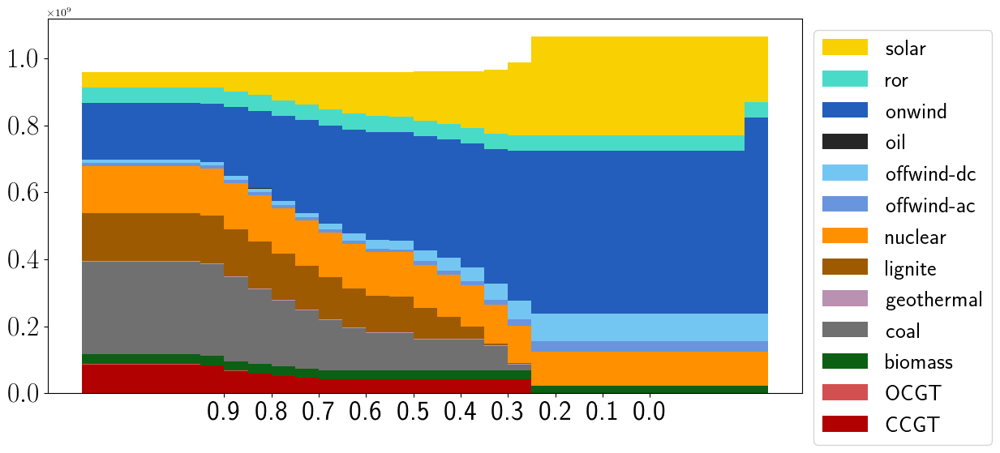

In [282]:
from cycler import cycler

custom_cycler = cycler(color = [colors[row[0]] for row in generation_by_carrier_and_co2l.iterrows()])

f,ax = plt.subplots(figsize = (12,6))
ax.set_prop_cycle(custom_cycler)

co2s = generation_by_carrier_and_co2l.columns.astype('float')
index = np.argsort(co2s)

width = 0.5

old_values = np.zeros(len(generation_by_carrier_and_co2l.columns))

for row in generation_by_carrier_and_co2l.iterrows():
    ax.bar(co2s[index], 
           (row[1].values)[index], 
           width,  
           label = row[0],
           bottom = old_values)
    old_values += (row[1].values)[index]
    #ax.plot(data.index[:-2].astype('int'), old_values)
    
handles, labels = ax.get_legend_handles_labels()
ax.legend(handles[::-1], labels[::-1],fontsize = 20, bbox_to_anchor=(1.0, 1),)
ax.set_xticks(co2s[index][::2])
ax.set_xticklabels(co2s[index][::2])
ax.invert_xaxis()

ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
#ax.set_ylabel(r'$10^6 \text{ CO}_2\text{-eq}$',fontsize=30)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.95-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wi

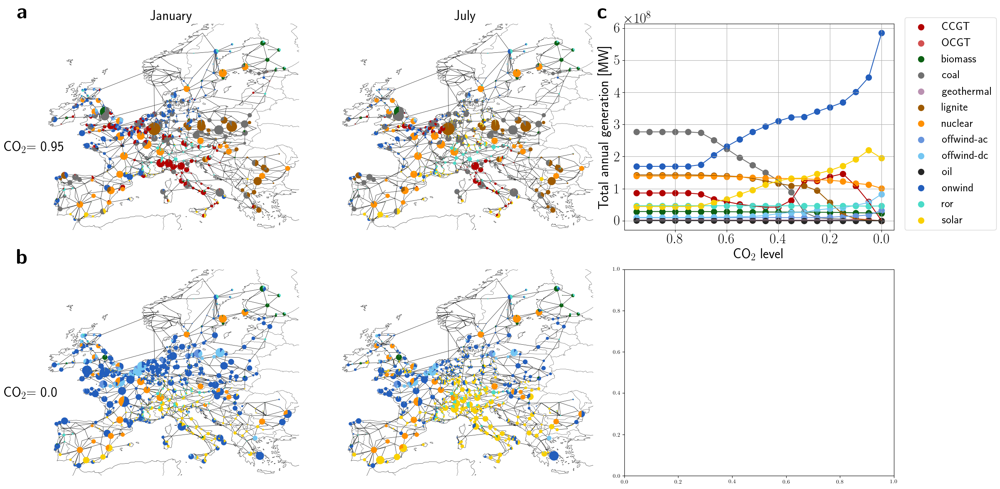

In [220]:
mpl.style.use('default')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}\usepackage{bm}')

target_levels = [0.95,0.0]

f = plt.figure(figsize = (24,12))

gs = GridSpec(2, 3, figure = f)

ax1 = [f.add_subplot(gs[0, i],projection = ccrs.PlateCarree()) for i in range(2)]
ax2 = [f.add_subplot(gs[1, i],projection = ccrs.PlateCarree()) for i in range(2)]
axs = [ax1,ax2]

ax3 = f.add_subplot(gs[0, 2])
ax4 = f.add_subplot(gs[1, 2])

f.subplots_adjust(hspace = 0.05, wspace = 0.05)

#f,ax = plt.subplots(2,3,figsize = (24,12),subplot_kw = {"projection":ccrs.PlateCarree()})
vmax = 3.2e2
months = [1,7]

labels = [[r'\textbf{a}',r'',r'\textbf{c}'],[r'\textbf{b}','',r'\textbf{d}','','']]

for i,ind in enumerate(target_levels):
    n = pypsa.Network()
    n.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{ind}-3H.nc')
    
    for j,month in enumerate(months):
        
        axs[i][j].set_ylim([0,vmax])
        current_snapshots = n.snapshots[n.snapshots.month == month]

        
        n.plot(bus_sizes = n.generators_t.p.loc[current_snapshots].sum().groupby([n.generators["bus"],n.generators["carrier"]]).sum()/2e6,
               line_colors = 'black',
               link_colors = 'black', 
               link_widths = 0.5,
               line_widths = 0.5,
               ax = axs[i][j])
        
        
        
        if i == 0:
            axs[i][j].set_title(current_snapshots.month_name()[0], fontsize = 24)
            
        axs[i][j].text(0- 0.1, 1+0.05, 
                         labels[i][j],
                         fontsize = 36,
                         weight = 'bold',
                         verticalalignment = 'center',
                         transform = axs[i][j].transAxes)

        
axs[0][0].text(0- 0.15, 0.4, 
            r'CO$_2$= '+str(0.95),
            fontsize = 24,
            verticalalignment = 'center',
            transform = axs[0][0].transAxes)        

axs[1][0].text(0- 0.15, 0.4, 
            r'CO$_2$= '+str(0.0),
            fontsize = 24,
            verticalalignment = 'center',
            transform = axs[1][0].transAxes)     

##############################     
co2s = generation_by_carrier_and_co2l.columns.astype('float')
index = np.argsort(co2s)

for row in generation_by_carrier_and_co2l.iterrows():
    ax3.scatter(co2s[index],
               (row[1].values)[index],
               color = colors[row[0]],
               label = row[0],
               s = 100)
    
    ax3.plot(co2s[index],
            (row[1].values)[index],
            color = colors[row[0]])
    
ax3.invert_xaxis()
ax3.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax3.set_xlabel(r'$\text{CO}_2 \text{ level}$',  fontsize = 24)
ax3.set_ylabel(r'Total annual generation [MW]', fontsize = 24)

ax3.grid(True)
ax3.yaxis.offsetText.set_fontsize(24)
ax3.text(0- 0.1, 1+0.05, 
                         labels[0][2],
                         fontsize = 36,
                         weight = 'bold',
                         verticalalignment = 'center',
                         transform = ax3.transAxes)
ax3.legend(fontsize = 20,loc=(1.04,0))
#ax3.set_yscale('log')

plt.tight_layout()
plt.savefig(save_path+'Figures/Generation_mix_versus_co2level.pdf',bbox_inches='tight')

plt.show()

### Primay failure likelihood

In [287]:
edge_likelihoods = []

for count,co2l in enumerate(co2ls):
    path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
    results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'
    
    network = pypsa.Network()
    currentlevel = np.round(co2l,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#
    
    criterion = 'nodes'
    snet_index = 0
    
    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
   
    index = list(G.edges()).index(e)
    
    pos = nx.get_node_attributes(G,'pos')
    splitting_cascades = pickle.load(open(results_path+
                                          f'system_splits_Co2L{currentlevel}.pickle' ,'rb'))
    
    solution_dict = pickle.load(open(results_path+f'Europe_Co2L{currentlevel}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'.pickle','rb'))
    
    number_of_snapshots = len(network.snapshots)
    
    likelihood_primary, likelihood_secondary = visualisation.calc_likelihood_failure(G,
                                                                splitting_cascades,
                                                                number_of_snapshots,
                                                                solution_dict = solution_dict)
    likelihood = [likelihood_secondary[(u,v)] for u,v in G.edges()]
    edge_likelihoods.append(likelihood)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.5-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

In [288]:
#np.save(save_path + 'secondary_likelihoods_versus_co2ls.npy',edge_likelihoods)

In [290]:
edge_likelihoods_primary = np.load(save_path+'primary_likelihoods_versus_co2ls.npy')
edge_likelihoods_secondary = np.load(save_path+'secondary_likelihoods_versus_co2ls.npy')

In [ ]:
f,ax = plt.subplots(1,4,figsize = (24,5))

mpl.style.use('default')
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

cmap = copy.copy(mpl.cm.get_cmap("magma_r"))
cmap.set_under('gainsboro',1.0)

labels = [r'\textbf{a}',r'\textbf{b}',r'\textbf{c}',r'\textbf{d}']



edge_likelihoods = []

f.subplots_adjust(hspace = 0.05, wspace = 0.05)

#co2ls = np.array([0.0,0.25,0.5,0.75])

vmaxvals = []
vminvals = []

for count,co2l in enumerate(co2ls):
    path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
    results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'
    
    network = pypsa.Network()
    currentlevel = np.round(co2l,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#
    
    criterion = 'nodes'
    snet_index = 0
    
    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
   
    index = list(G.edges()).index(e)
    
    pos = nx.get_node_attributes(G,'pos')
    splitting_cascades = pickle.load(open(results_path+
                                          f'system_splits_Co2L{currentlevel}.pickle' ,'rb'))
    
    solution_dict = pickle.load(open(results_path+f'Europe_Co2L{currentlevel}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'.pickle','rb'))
    
    number_of_snapshots = len(network.snapshots)
    
    likelihood_primary, likelihood_secondary = visualisation.calc_likelihood_failure(G,
                                                                splitting_cascades,
                                                                number_of_snapshots,
                                                                solution_dict = solution_dict)
    likelihood = [likelihood_primary[(u,v)] for u,v in G.edges()]
    
    c_H = np.array([np.log10(x) if x>1e-8 else -np.inf for x in likelihood])

    edge_likelihoods.append(10**c_H[index])
    
    vmax = 0.66#10**(np.max(c_H[np.logical_and(np.logical_and(~np.isnan(c_H),c_H!=-float("inf")),c_H!=1e5)]))
    vmin = 3.4e-4#10**(np.min(c_H[np.logical_and(~np.isnan(c_H),c_H!=-float("inf"))]))  
    vmaxvals.append(vmax)
    vminvals.append(vmin)
    
    
    nodes = nx.draw_networkx_nodes(G, 
                                   pos = pos,
                                   ax = ax[count],
                                   node_color = 'black',
                                   node_size = 0)
    
    edges = nx.draw_networkx_edges(G, 
                                   pos = pos,
                                   ax = ax[count], 
                                   edge_color = c_H,
                                   width = 3.5,
                                   edge_cmap = cmap,
                                   edge_vmin = np.log10(vmin),
                                   edge_vmax = np.log10(vmax))
    
    ax[count].axis('off')    
    ax[count].set_title(r'$\text{CO}_2 = %.2f$'%currentlevel,fontsize = 28)
    ax[count].text(0- 0.075, 1+0.05, 
        labels[count],
        fontsize = 30,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax[count].transAxes)
    #ax[xcoord,ycoord].scatter([0],[1])
    
cbar_ax = f.add_axes([0.17, 0.1, 0.7, 0.03])#    
sm = plt.cm.ScalarMappable(cmap = cmap,norm = mplcolors.LogNorm(vmin = vmin,vmax = vmax)) 
cb = f.colorbar(sm,cax = cbar_ax,orientation = 'horizontal')
cb.ax.tick_params(labelsize = 26, width = 1.0, which = 'both')
ax[0].text(0.1, 0.0, 
               r'$\langle p_{\ell}^{\text{p}}\rangle$',
               fontsize = 25, 
               weight = 'bold',
               verticalalignment = 'center',
               transform = ax[0].transAxes)

#plt.savefig(save_path+'Figures/Fig4_Primary_likelihoods_Europe.pdf',bbox_inches = 'tight')

plt.show()

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.95-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


[-1.492255      -inf      -inf ...      -inf      -inf      -inf]
[-0.8452468       -inf       -inf ...       -inf       -inf       -inf]
[-0.65180186        -inf        -inf ...        -inf        -inf
        -inf]
[-1.0726859  -1.51114034        -inf ...        -inf        -inf
        -inf]


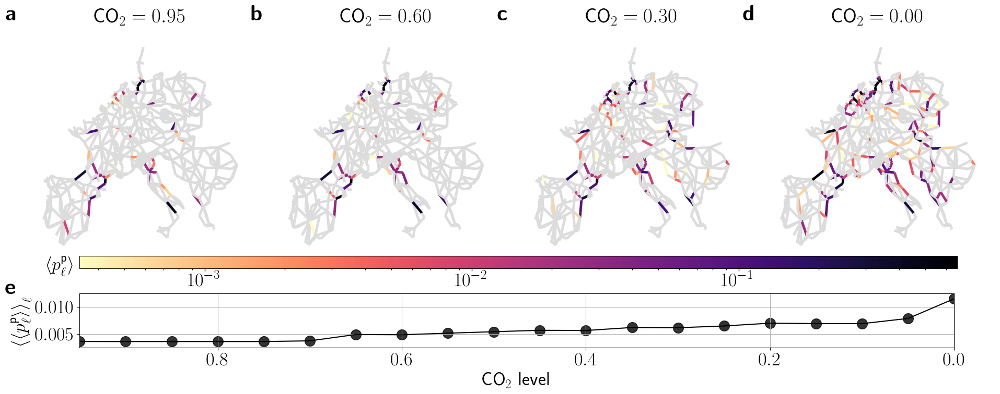

In [703]:
f = plt.figure(figsize = (24,8))

gs = GridSpec(4, 4, figure = f)

axs = [f.add_subplot(gs[:3, i]) for i in range(4)]

ax0 = f.add_subplot(gs[3, :])

f.subplots_adjust(hspace = 0.05, wspace = 0.05)

mpl.style.use('default')
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

cmap = copy.copy(mpl.cm.get_cmap("magma_r"))
cmap.set_under('gainsboro',1.0)

labels = [r'\textbf{a}',r'\textbf{b}',r'\textbf{c}',r'\textbf{d}']


co2ls = np.array([0.00,0.3,0.6,0.95])
all_co2ls = np.arange(0.0,0.99,0.05)

vmaxvals = []
vminvals = []

path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'

network = pypsa.Network()
currentlevel = np.round(co2l,2)
network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#

criterion = 'nodes'
snet_index = 0

G = utils.build_networkx_graph(network,snet_index = snet_index)
pos = nx.get_node_attributes(G,'pos')


for count,co2l in enumerate(co2ls[::-1]):
 
    ind = np.where(np.round(all_co2ls,2) == co2l)[0][0]
    
    c_H = edge_likelihoods[ind]
    print(c_H)
    vmax = 0.66#10**(np.max(c_H[np.logical_and(np.logical_and(~np.isnan(c_H),c_H!=-float("inf")),c_H!=1e5)]))
    vmin = 3.4e-4#10**(np.min(c_H[np.logical_and(~np.isnan(c_H),c_H!=-float("inf"))]))  
    vmaxvals.append(vmax)
    vminvals.append(vmin)
    
    
    nodes = nx.draw_networkx_nodes(G, 
                                   pos = pos,
                                   ax = axs[count],
                                   node_color = 'black',
                                   node_size = 0)
    
    edges = nx.draw_networkx_edges(G, 
                                   pos = pos,
                                   ax = axs[count], 
                                   edge_color = c_H,
                                   width = 3.5,
                                   edge_cmap = cmap,
                                   edge_vmin = np.log10(vmin),
                                   edge_vmax = np.log10(vmax))
    
    axs[count].axis('off')    
    axs[count].set_title(r'$\text{CO}_2 = %.2f$'%co2l,fontsize = 28)
    axs[count].text(0- 0.075, 1+0.05, 
        labels[count],
        fontsize = 30,
        weight = 'bold',
        verticalalignment = 'center',
        transform = axs[count].transAxes)
    
cbar_ax = f.add_axes([0.17, 0.3, 0.7, 0.03])#    
sm = plt.cm.ScalarMappable(cmap = cmap,norm = mplcolors.LogNorm(vmin = vmin,vmax = vmax)) 
cb = f.colorbar(sm,cax = cbar_ax,orientation = 'horizontal')
cb.ax.tick_params(labelsize = 26, width = 1.0, which = 'both')
axs[0].text(0.1, 0.0, 
               r'$\langle p_{\ell}^{\text{p}}\rangle$',
               fontsize = 25, 
               weight = 'bold',
               verticalalignment = 'center',
               transform = axs[0].transAxes)

#######################################################

ax0.scatter(all_co2ls[::-1],
        np.sum(10**edge_likelihoods,axis = 1)[::-1]/len(G.edges()), 
           s = 200,
          alpha = 0.8,
           color = 'black')

ax0.plot(all_co2ls[::-1],
        np.sum(10**edge_likelihoods,axis = 1)[::-1]/len(G.edges()),
        color = 'black')

ax0.tick_params(axis = 'both', which = 'both', labelsize = 26)


ax0.grid()
ax0.set_xlim([0,0.95])
ax0.set_ylim([0.0025,0.0125])
ax0.set_xlabel(r'$\text{CO}_2 \text{ level}$', fontsize = 26)
ax0.set_ylabel(r'$\left\langle \langle p_{\ell}^{\text{p}}\rangle\right\rangle_{\ell}$', fontsize = 26)

pos1 = ax0.get_position()
pos2 = [pos1.x0+0.045, pos1.y0,pos1.width*0.9,pos1.height*0.7]
ax0.set_position(pos2)

ax0.invert_xaxis()

ax0.text(0- 0.085, 
         1+0.1, 
        r'\textbf{e}',
        fontsize = 30,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax0.transAxes)

#ax0.legend(fontsize = 16)

plt.savefig(save_path+'Figures/Fig4_Primary_likelihoods_Europe.pdf',bbox_inches = 'tight')

plt.show()

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


0.0032 3.38e-07


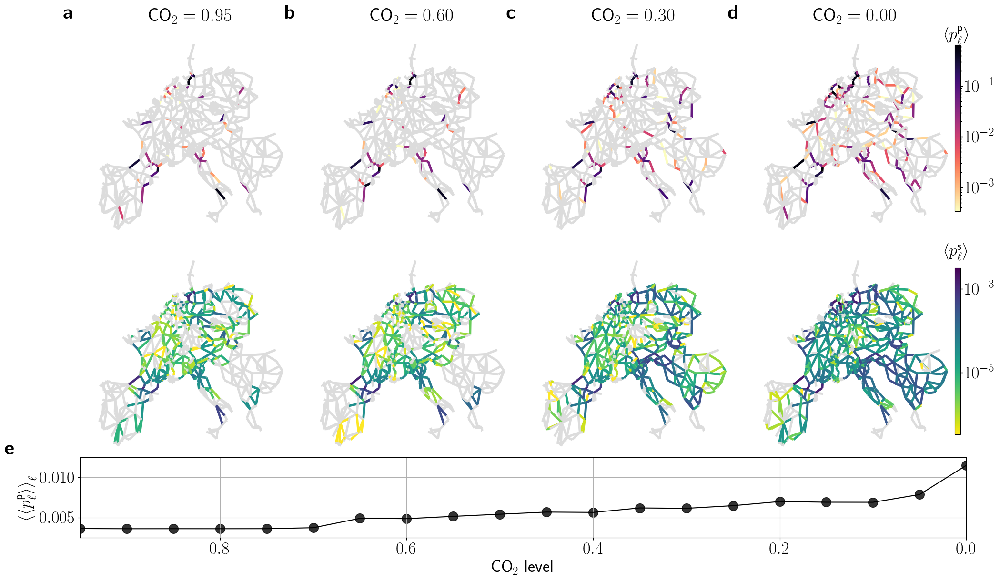

In [314]:
f = plt.figure(figsize = (24,14))

gs = GridSpec(7, 4, figure = f)

axs = [f.add_subplot(gs[:3, i]) for i in range(4)]
axs2 = [f.add_subplot(gs[3:6, i]) for i in range(4)]

ax0 = f.add_subplot(gs[6, :])

f.subplots_adjust(hspace = -0.1, wspace = 0.0)

mpl.style.use('default')
plt.rc('text', usetex=True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

cmap = copy.copy(mpl.cm.get_cmap("magma_r"))
cmap.set_under('gainsboro',1.0)

labels = [r'\textbf{a}',r'\textbf{b}',r'\textbf{c}',r'\textbf{d}']


co2ls = np.array([0.00,0.3,0.6,0.95])
all_co2ls = np.arange(0.0,0.99,0.05)

vmaxvals = []
vminvals = []

path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'

network = pypsa.Network()
currentlevel = np.round(co2l,2)
network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#

criterion = 'nodes'
snet_index = 0

G = utils.build_networkx_graph(network,snet_index = snet_index)
pos = nx.get_node_attributes(G,'pos')


for count,co2l in enumerate(co2ls[::-1]):
 
    ind = np.where(np.round(all_co2ls,2) == co2l)[0][0]
    
    c_H = edge_likelihoods_primary[ind]

    #print(c_H)
    vmax = 0.66#10**(np.max(c_H[np.logical_and(np.logical_and(~np.isnan(c_H),c_H!=-float("inf")),c_H!=1e5)]))
    vmin = 3.4e-4#10**(np.min(c_H[np.logical_and(~np.isnan(c_H),c_H!=-float("inf"))]))  
   
    
    nodes = nx.draw_networkx_nodes(G, 
                                   pos = pos,
                                   ax = axs[count],
                                   node_color = 'black',
                                   node_size = 0)
    
    edges = nx.draw_networkx_edges(G, 
                                   pos = pos,
                                   ax = axs[count], 
                                   edge_color = c_H,
                                   width = 3.5,
                                   edge_cmap = cmap,
                                   edge_vmin = np.log10(vmin),
                                   edge_vmax = np.log10(vmax))
    
    axs[count].axis('off')   
 

cbar_ax = f.add_axes([0.89, 0.6, 0.005, 0.25])#f.add_axes([0.89, 0.35, 0.005, 0.45])#    
sm = plt.cm.ScalarMappable(cmap = cmap,norm = mplcolors.LogNorm(vmin = vmin,vmax = vmax)) 
cb = f.colorbar(sm,cax = cbar_ax)
cb.ax.tick_params(labelsize = 26, width = 1.0, which = 'both')
axs[3].text(0.9, 0.95, 
               r'$\langle p_{\ell}^{\text{p}}\rangle$',
               fontsize = 25, 
               weight = 'bold',
               verticalalignment = 'center',
               transform = axs[3].transAxes)

    
cmap = copy.copy(mpl.cm.get_cmap("viridis_r"))
cmap.set_under('gainsboro',1.0)

for count,co2l in enumerate(co2ls[::-1]):
    
    ind = np.where(np.round(all_co2ls,2) == co2l)[0][0]

    c_H = edge_likelihoods_secondary[ind]
    c_H = np.array([np.log10(x) if x>1e-8 else -np.inf for x in c_H])
    
    #print(c_H)
    vmax = 3.2e-3#10**(np.max(c_H[np.logical_and(np.logical_and(~np.isnan(c_H),c_H!=-float("inf")),c_H!=1e5)]))
    vmin = 3.38e-7#10**(np.min(c_H[np.logical_and(~np.isnan(c_H),c_H!=-float("inf"))]))  
    vmaxvals.append(vmax)
    vminvals.append(vmin)
    
    
    nodes = nx.draw_networkx_nodes(G, 
                                   pos = pos,
                                   ax = axs2[count],
                                   node_color = 'black',
                                   node_size = 0)
    
    edges = nx.draw_networkx_edges(G, 
                                   pos = pos,
                                   ax = axs2[count], 
                                   edge_color = c_H,
                                   width = 3.5,
                                   edge_cmap = cmap,
                                   edge_vmin = np.log10(vmin),
                                   edge_vmax = np.log10(vmax))
    
    axs2[count].axis('off') 
    
    axs[count].set_title(r'$\text{CO}_2 = %.2f$'%co2l,fontsize = 28)
    axs[count].text(0- 0.075, 1+0.05, 
        labels[count],
        fontsize = 30,
        weight = 'bold',
        verticalalignment = 'center',
        transform = axs[count].transAxes)
    
cbar_ax = f.add_axes([0.89, 0.265, 0.005, 0.25])#f.add_axes([0.89, 0.35, 0.005, 0.45])#    
sm = plt.cm.ScalarMappable(cmap = cmap,norm = mplcolors.LogNorm(vmin = vmin,vmax = vmax)) 
cb = f.colorbar(sm,cax = cbar_ax)
cb.ax.tick_params(labelsize = 26, width = 1.0, which = 'both')
axs2[3].text(0.9, 0.95, 
               r'$\langle p_{\ell}^{\text{s}}\rangle$',
               fontsize = 25, 
               weight = 'bold',
               verticalalignment = 'center',
               transform = axs2[3].transAxes)
print(np.max(vmaxvals),np.min(vminvals))

#######################################################

ax0.scatter(all_co2ls[::-1],
        np.sum(10**edge_likelihoods_primary,axis = 1)[::-1]/len(G.edges()), 
           s = 200,
          alpha = 0.8,
           color = 'black')

ax0.plot(all_co2ls[::-1],
        np.sum(10**edge_likelihoods_primary,axis = 1)[::-1]/len(G.edges()),
        color = 'black')

ax0.tick_params(axis = 'both', which = 'both', labelsize = 26)


ax0.grid()
ax0.set_xlim([0,0.95])
ax0.set_ylim([0.0025,0.0125])
ax0.set_xlabel(r'$\text{CO}_2 \text{ level}$', fontsize = 26)
ax0.set_ylabel(r'$\left\langle \langle p_{\ell}^{\text{p}}\rangle\right\rangle_{\ell}$', fontsize = 26)

#pos1 = ax0.get_position()
#pos2 = [pos1.x0+0.045, pos1.y0,pos1.width*0.9,pos1.height*0.7]
#ax0.set_position(pos2)

ax0.invert_xaxis()

ax0.text(0- 0.085, 
         1+0.1, 
        r'\textbf{e}',
        fontsize = 30,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax0.transAxes)

#ax0.legend(fontsize = 16)

plt.savefig(save_path+'Figures/Fig4_likelihoods_Europe.pdf',bbox_inches = 'tight')

plt.show()

In [ ]:
e = ('DE0 93', 'DE0 95')


co2ls = np.arange(0.0,0.99,0.05) # np.array([0.0,0.25,0.5,0.75])

edge_likelihoods = np.zeros((len(co2ls),1008))

for count,co2l in enumerate(co2ls):

    path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
    results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'
    
    network = pypsa.Network()
    currentlevel = np.round(co2l,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc') # +year+'/elec_s_306_ec_lv1.0_1H.nc')#
    
    criterion = 'nodes'
    snet_index = 0
    
    
    G = utils.build_networkx_graph(network,snet_index = snet_index)
    index = list(G.edges()).index(e)
    
    pos = nx.get_node_attributes(G,'pos')
    splitting_cascades = pickle.load(open(results_path+
                                          f'system_splits_Co2L{currentlevel}.pickle' ,'rb'))
    
    solution_dict = pickle.load(open(results_path+f'Europe_Co2L{currentlevel}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'.pickle','rb'))
    
    number_of_snapshots = len(network.snapshots)
    
    likelihood_primary, likelihood_secondary = visualisation.calc_likelihood_failure(G,
                                                                splitting_cascades,
                                                                number_of_snapshots,
                                                                solution_dict = solution_dict)
    likelihood = [likelihood_primary[(u,v)] for u,v in G.edges()]
    
    c_H = np.array([np.log10(x) if x>1e-8 else -np.inf for x in likelihood])

    edge_likelihoods[count] = c_H

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))


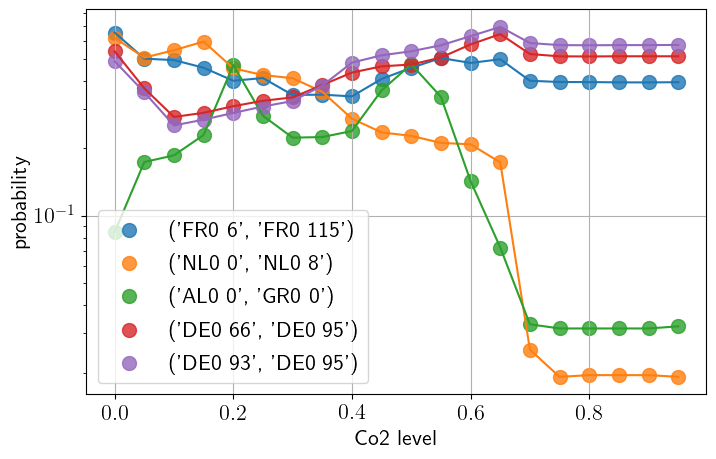

[601 450 450 450   0 450 450 460 473 473 473 473 473 473 473 473 473 473
 473 473]


('DE0 93', 'DE0 95')

In [596]:
index = 450 # 450
indices = [601,450,0,460,473]
co2ls = np.arange(0.0,0.99,0.05) # np.array([0.0,0.25,0.5,0.75])

f,ax = plt.subplots(figsize = (8,5))

for index in indices:
    ax.scatter(co2ls,
               10**edge_likelihoods[:,index], 
               s = 100,
              alpha = 0.8,
              label = list(G.edges())[index])
    ax.plot(co2ls,
            10**edge_likelihoods[:,index])

ax.set_yscale('log')
ax.tick_params(axis = 'both', which = 'both', labelsize = 16)
ax.set_xlabel('Co2 level', fontsize = 16)
ax.set_ylabel('probability', 
              fontsize = 16)
ax.grid()

ax.legend(fontsize = 16)

plt.show()

print(np.argmax(edge_likelihoods,axis = 1))

list(G.edges())[index]

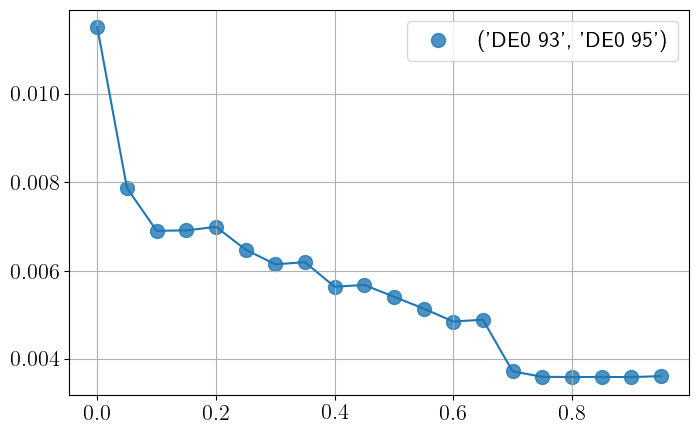

In [556]:
f,ax = plt.subplots(figsize = (8,5))

ax.scatter(co2ls,
        np.sum(10**edge_likelihoods,axis = 1)/len(G.edges()), 
           s = 100,
          alpha = 0.8,
          label = list(G.edges())[index])
ax.plot(co2ls,
        np.sum(10**edge_likelihoods,axis = 1)/len(G.edges()))

#ax.set_yscale('log')
ax.tick_params(axis = 'both', which = 'both', labelsize = 16)

ax.grid()

ax.legend(fontsize = 16)

plt.show()



## Distribution of Inertia, load imbalance and ROCOF

In [101]:
mpl.style.use('seaborn')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

criterion = 'nodes'

path = '/media/fkaiser/'
save_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'

path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'

snet_index = 0

#f,ax = plt.subplots(1,6,figsize = (24,5))#plt.subplots(5,2,figsize = (24,50))
RoCoF = []
load_imbalances = []
inertia_proxies = []
stamps = []


co2ls = np.arange(0.0,0.99,0.05)

for count,co2l in enumerate(co2ls):
    RoCoF.append([])
    load_imbalances.append([])
    inertia_proxies.append([])
    stamps.append([])
    
    level = np.round(co2l,2)
    network = pypsa.Network()
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')

    
    G = utils.build_networkx_graph(network, snet_index = snet_index)
    
    try: 
        splitting_cascades = pickle.load(open(results_path+
                                            f'system_splits_Co2L{level}.pickle','rb'))
        fname = f'Europe_Co2L{level}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'_w_hvdc.pickle'
        solution_dict = pickle.load(open(results_path + fname,'rb'))
    except FileNotFoundError:
        print(f'Europe_Co2L{co2l:.2f}')
        continue
    
    nof_splits = 0

    for key in solution_dict.keys():
        for j in range(len(solution_dict[key]))[1::2]:
            for k in range(len(solution_dict[key][j]['load_imbalance'])):
                RoCoF[count].append(solution_dict[key][j]['load_imbalance'][k]/solution_dict[key][j]['inertia_proxy'][k])
                load_imbalances[count].append(solution_dict[key][j]['load_imbalance'][k])
                inertia_proxies[count].append(solution_dict[key][j]['inertia_proxy'][k])
                stamps[count].append([key,solution_dict[key][int(j-1)]])
                #if ((co2l == 0.5) & (-80<=solution_dict[key][j]['load_imbalance'][k]/solution_dict[key][j]['inertia_proxy'][k]<=-70)):
                #    print(key)
    
            nof_splits += 1    
    RoCoF[count] = (np.array(RoCoF[count])*50/2/6).flatten()
    #bins = np.arange(-150,300,5)
    #ax[count].hist(RoCoF.flatten(),bins = bins, label = r'$\text{CO}_2\text{ level} = %.1f$'%co2l)#i//2,i%2
    #ax[count].set_xlabel(r'$RoCoF$',
    #                       fontsize = 24)
#
    #ax[count].tick_params(axis = 'both', which = 'both', labelsize = 24)
    #ax[count].set_yscale('log')
    #ax[count].set_title('Total splits: %i'%nof_splits, fontsize = 24)
    #ax[count].legend(fontsize=20)
    #ax[count].set_ylim([1,5e4])

#plt.tight_layout()
#plt.savefig(save_path+'Europe_RoCoF_'+criterion+'_based.pdf')

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
<ipython-input-101-189c09a894d9>:51: RuntimeWarning: divide by zero encountered in double_scalars
  RoCoF[count].append(solution_dict[key][j]['load_imbalance'][k]/solution_dict[k

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.4-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
<ipython-input-101-189c09a894d9>:51: RuntimeWarning: divide by zero encountered in double_scalars
  RoCoF[count].append(solution_dict[key][j]['load_imbalance'][k]/solution_dict[k

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.8-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
<ipython-input-101-189c09a894d9>:51: RuntimeWarning: divide by zero encountered in double_scalars
  RoCoF[count].append(solution_dict[key][j]['load_imbalance'][k]/solution_dict[k

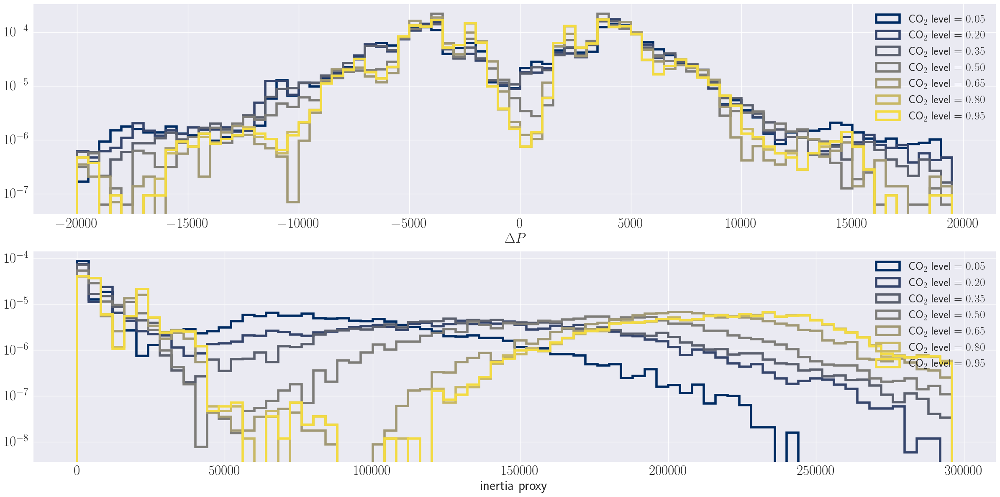

In [497]:
mpl.style.use('seaborn')
f,ax = plt.subplots(2,figsize = (24,12))#plt.subplots(5,2,figsize = (24,50))
snet_index = 0
cmap = plt.get_cmap('cividis')
for count in range(len(co2ls))[1::3]:
    maxval = int(2e4)#3.5e4
    bins = np.arange(-maxval,maxval,500)
    #ax[count].hist(RoCoF.flatten(),bins = bins, label = r'$\text{CO}_2\text{ level} = %.1f$'%co2l)#i//2,i%2
    if len(load_imbalances[count]):
        ax[0].hist(load_imbalances[count],
                            bins = bins, 
                            histtype='step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2ls[count],
                  linewidth = 4,
                  color = cmap(count/len(co2ls)),
                  density = True)
    
        
        maxval = int(3e5)#4e5
        bins = np.arange(0,maxval,4000)
        #bins = np.arange(0,5e3,500)
        ax[1].hist(inertia_proxies[count],
                            bins = bins, 
                            histtype='step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2ls[count],
                            linewidth = 4,
                  color = cmap(count/len(co2ls)),
                  density = True)   


ax[0].set_xlabel(r'$\Delta P$',
                            fontsize = 24)    
ax[1].set_xlabel(r'inertia proxy',
                            fontsize = 24)
for i in range(2):
        ax[i].tick_params(axis = 'both', which = 'both', labelsize = 24)
        ax[i].set_yscale('log')
        ax[i].legend(fontsize=20)
        #ax[i].set_ylim([1,5e4])
        
ax[1].yaxis.offsetText.set_fontsize(24)
plt.tight_layout()

#plt.savefig(save_path+'Europe_load_imbalance_and_inertia_proxies_step_histogram_linear_scale.pdf',bbox_inches = 'tight')
plt.show()

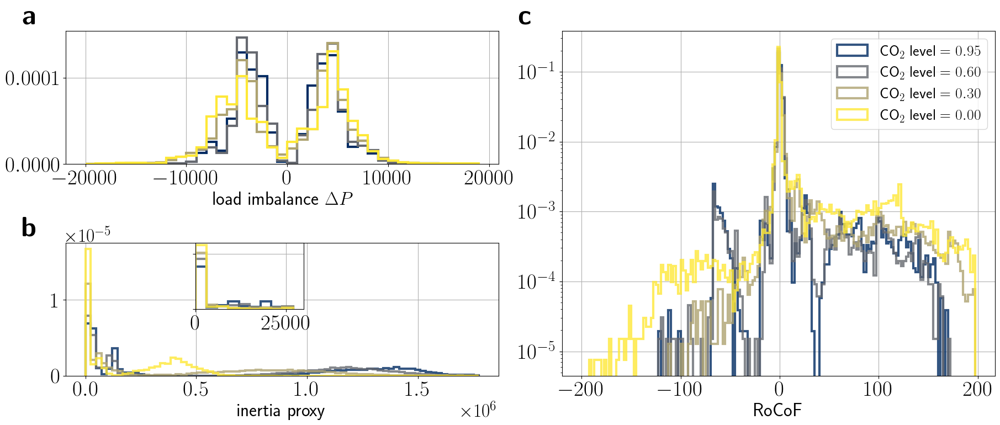

In [106]:
labels = [r'\textbf{a}',r'\textbf{b}',r'\textbf{c}',r'\textbf{d}',r'\textbf{e}']

mpl.style.use('default')

plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

co2ls = np.arange(0.0,0.99,0.05)

f = plt.figure(figsize = (18,10),constrained_layout = True)

gs = GridSpec(3, 4, figure = f)


ax0 = f.add_subplot(gs[0, :2])
ax1 = f.add_subplot(gs[1, :2])

ax_ins = ax1.inset_axes([0.3, 0.5, 0.25, 0.5])
x1, x2, y1, y2 = 0.0, 6*5000, 0, 0.0003

ax_ins.set_xlim(x1, x2)
ax_ins.set_ylim(y1, y2)

#ax_ins.set_xticklabels('')
ax_ins.set_yticklabels('')


ax2 = f.add_subplot(gs[:2, 2:])
#axs = [f.add_subplot(gs[2,i]) for i in range(4)]


snet_index = 0
cmap = plt.get_cmap('cividis_r')

current_co2ls = np.array([0.00,0.3,0.6,0.95])

for count,level in enumerate(current_co2ls[::-1]):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]
    
    maxval = int(2e4)#3.5e4
    bins = np.arange(-maxval,maxval,1000)
    #ax[count].hist(RoCoF.flatten(),bins = bins, label = r'$\text{CO}_2\text{ level} = %.1f$'%co2l)#i//2,i%2
    if len(load_imbalances[ind]):
        ax0.hist(load_imbalances[ind],
                            bins = bins, 
                            histtype='step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                  linewidth = 3,
                  color = cmap(ind/len(co2ls)),
                  density = True)
    

        maxval = int(1.8e6)#4e5
        bins = np.arange(0,maxval,24000)
        #bins = np.arange(0,5e3,500)
        ax1.hist(np.array(inertia_proxies[ind])*6,
                            bins = bins, 
                            histtype = 'step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                            linewidth = 3,
                  color = cmap(ind/len(co2ls)),
                 alpha = 0.8,
                  density = True)   
        
        bins = np.arange(0,3e4,3000)
        ax_ins.hist(np.array(inertia_proxies[ind])*6,
                            bins = bins, 
                            histtype = 'step',
                            linewidth = 3,
                  color = cmap(ind/len(co2ls)),
                 alpha = 0.8,
                  density = True) 

        maxval = int(2e2)#4e5
        bins = np.arange(-maxval,maxval,2.5)
        #bins = np.arange(0,5e3,500)
        ax2.hist(RoCoF[ind],
                            bins = bins, 
                            histtype='step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                            linewidth = 3,
                  color = cmap(ind/len(co2ls)),
                 alpha = 0.8,
                  density = True) 

ax2.grid(True)
ax1.grid(True)
ax0.grid(True)
ax_ins.grid(True)

ax0.set_xlabel(r'load imbalance $\Delta P$',
                            fontsize = 24)    
ax1.set_xlabel(r'inertia proxy',
                            fontsize = 24)


#from matplotlib import ticker
#formatter = ticker.ScalarFormatter(useMathText=True)
#formatter.set_scientific(True) 
#ax0.yaxis.set_major_formatter(formatter) 
#ax0.ticklabel_format(useOffset=True)
ax_ins.tick_params(axis = 'both', which = 'both', labelsize = 28)

ax0.tick_params(axis = 'both', which = 'both', labelsize = 28)
#ax0.legend(fontsize=20)
ax1.tick_params(axis = 'both', which = 'both', labelsize = 28)
#ax1.legend(fontsize=20)
ax1.yaxis.offsetText.set_fontsize(24)
ax1.xaxis.offsetText.set_fontsize(24)


################################################

ax2.tick_params(axis = 'both', which = 'both', labelsize = 28)
ax2.legend(fontsize = 20)
ax2.set_xlabel(r'RoCoF',fontsize = 24) 
ax2.set_yscale('log')


ax0.text(0- 0.1, 1+0.1, 
        labels[0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax0.transAxes)

ax1.text(0- 0.1, 1+0.1, 
        labels[1],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax1.transAxes)

ax2.text(0- 0.1, 1+0.04, 
        labels[2],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax2.transAxes)

#ax1.indicate_inset_zoom(ax_ins, edgecolor="black")
#ax3.text(0- 0.1, 1+0.05, 
#        labels[3],
#        fontsize = 36,
#        weight = 'bold',
#        verticalalignment = 'center',
#        transform = ax3.transAxes)
#ax4.text(0- 0.1, 1+0.02, 
#        labels[4],
#        fontsize = 36,
#        weight = 'bold',
#        verticalalignment = 'center',
#        transform = ax4.transAxes)
#ax[i].set_ylim([1,5e4])
#plt.tight_layout()

plt.savefig(save_path+'Figures/Fig5_Rocof_and_inertia_proxies.pdf',bbox_inches = 'tight')    

plt.show()

0
2
4
6
8
10
12
14
16
18


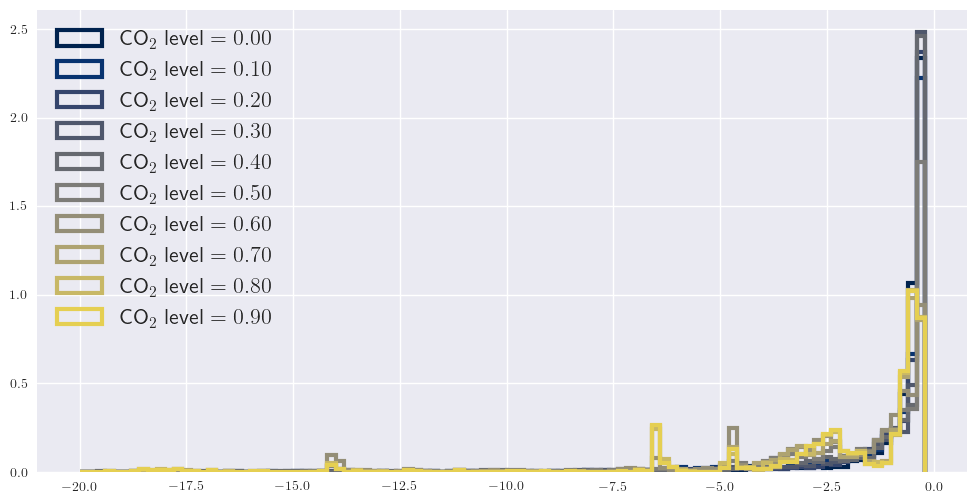

In [628]:
f,ax = plt.subplots(figsize=(12,6))

snet_index = 0
cmap = plt.get_cmap('cividis')
for count in range(len(co2ls))[::2]:
    print(count)
    
    if len(load_imbalances[count]):

        maxval = int(2e1)#4e5
        bins = np.arange(-maxval,0,0.2)
        #bins = np.arange(0,5e3,500)
        ax.hist(RoCoF[count],
                            bins = bins, 
                            histtype='step',
                            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2ls[count],
                            linewidth = 3,
                  color = cmap(count/len(co2ls)),
                  density = True)  
ax.legend(fontsize = 16,loc = 2)
#ax.set_yscale('log')  
plt.show()

[-2.84086685e-01             inf -2.88299945e-01 ... -8.22064360e-01
 -8.12324777e-01  2.43814205e+05]


/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units


[17, {'inertia_proxy': [63816.62357907367, 30.009999999999998], 'load_imbalance': [-13294.071656692016, 6992.8482720864595], 'available_flexible_generation': [54004.35496765366, 1064.71432108916]}, 18, {'inertia_proxy': [63751.84457907366, 0.0], 'load_imbalance': [-2188.690128478629, 1087.7944000569605], 'available_flexible_generation': [51570.09499423154, 270.0]}, 22, {'inertia_proxy': [59463.09857907366, 4299.0], 'load_imbalance': [9364.054678088054, -6751.550040155156], 'available_flexible_generation': [49334.14231565908, 5756.459990719844]}, 24, {'inertia_proxy': [63816.21457907367, 30.884], 'load_imbalance': [-11790.141944795469, 13952.433118334862], 'available_flexible_generation': [53892.918477560896, 1262.1482609344432]}, 28, {'inertia_proxy': [63817.088579073665, 30.009999999999998], 'load_imbalance': [-4858.775905753137, 7036.309840853398], 'available_flexible_generation': [54140.35241740619, 1064.71432108916]}, 32, {'inertia_proxy': [63794.92257907367, 30.099999999999998], '

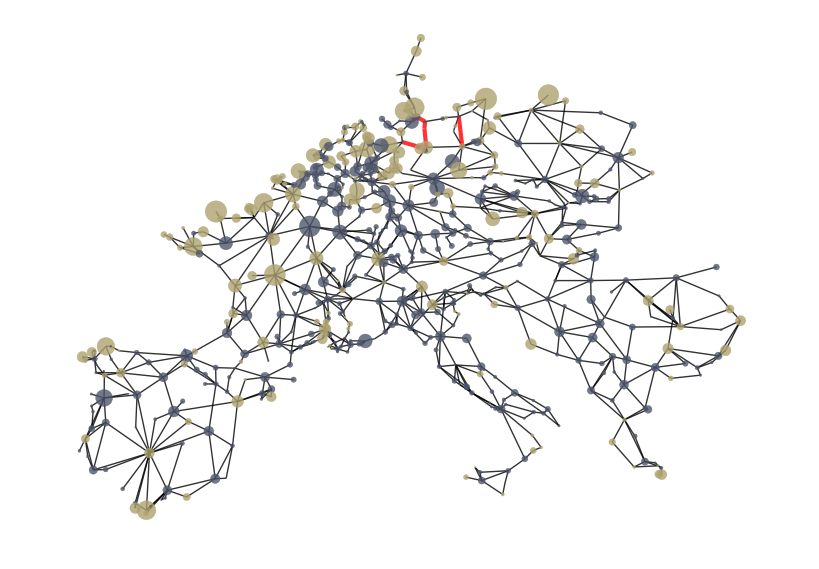

In [501]:
level = 0.0

co2index = np.where(co2ls == level)[0][0]
print(RoCoF[co2index])
noninf_indices = np.where(~np.isinf(RoCoF[co2index]))[0]
min_index = np.argmax(RoCoF[co2index][noninf_indices])
min_index = noninf_indices[min_index]
min_stamp = stamps[co2index][min_index]

network = pypsa.Network()
network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')

criterion = 'nodes'
snet_index = 0

Graph = utils.build_networkx_graph(network,snet_index = snet_index)
pos = nx.get_node_attributes(Graph,'pos')

splitting_cascades = pickle.load(open(results_path+f'system_splits_Co2L{level}.pickle','rb'))
solution_dict = pickle.load(open(results_path+f'Europe_Co2L{level}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'.pickle','rb'))

the_cascade = splitting_cascades[min_stamp[0]][min_stamp[1]]

the_cascade_variables = solution_dict[min_stamp[0]][8:]

print(the_cascade_variables)
print(min_stamp[1])

split_comps = utils.get_split_components(the_cascade,Graph, criterion = criterion)

timestamp = utils.solution_key_to_pandas_timestamp(min_stamp[0])

# Rescale load shedding since units for load shedding are different
# than for generation, storage and load
load_shedding_indices = network.generators[network.generators.carrier.isin(['load'])].index

current_generation = network.generators_t.p.loc[timestamp].copy()
current_generation[load_shedding_indices] /= 1e3
current_storage    = network.storage_units_t.p.loc[timestamp]
current_load       = network.loads_t.p.loc[timestamp]

generators = network.generators
loads = network.loads
storages = network.storage_units
print(len(split_comps))

for subgraph in split_comps:
    
    gens_ex   = generators[generators["bus"].isin(list(subgraph.nodes()))]
    loads_ex  = loads[loads["bus"].isin(list(subgraph.nodes()))]
    #print(current_load.loc[list(loads.index)])
    stores_ex = storages[storages["bus"].isin(list(subgraph.nodes()))]

    load_imbalance = current_generation.loc[list(gens_ex.index)].sum() + current_storage.loc[list(stores_ex.index)].sum()-\
                            current_load.loc[list(loads_ex.index)].sum()

    subgraph_gen = current_generation.loc[list(gens_ex.index)].groupby(gens_ex.bus).sum()
    subgraph_stor = current_storage.loc[list(stores_ex.index)].groupby(stores_ex.bus).sum()
    subgraph_load = current_load.loc[list(loads_ex.index)].groupby(loads_ex.bus).sum()
    node_balance = np.zeros(len(subgraph.nodes()))
    
    for count,node in enumerate(subgraph.nodes()):
        if node in subgraph_gen.index:
            node_balance[count] += subgraph_gen.loc[node]
        if node in subgraph_stor.index:
            node_balance[count] += subgraph_stor.loc[node]
        if node in subgraph_load.index:
            node_balance[count] -= subgraph_load.loc[node]
    print(np.sum(node_balance))      
    cmap = plt.get_cmap('cividis')
    node_colours = [cmap(0.3) if node_balance[i]<0 else cmap(0.7) for i in range(len(subgraph.nodes()))]
    pos = nx.get_node_attributes(Graph,'pos')
    
    nx.draw(subgraph,
            pos,
            node_size = np.abs(node_balance)/20, 
            node_color = node_colours,
            alpha = 0.8 )
    
diff_graph = nx.Graph()
diff_graph.add_edges_from(the_cascade)

nx.draw(diff_graph,
        pos,
        node_size = 0,
        edge_color = 'red',
        alpha = 0.8,
        width = 3)


In [695]:
example_key = list(splitting_cascades.keys())[0]
the_cascade = splitting_cascades[example_key][0]


[('PL0 3', 'PL0 34'), ('PL0 13', 'PL0 28'), ('PL0 28', 'PL0 34')]


In [292]:
HVDC_transport = network.links_t.p0.loc[timestamp].groupby(network.links["bus0"]).sum()
HVDC_transport = HVDC_transport.add(network.links_t.p1.loc[timestamp].groupby(network.links["bus1"]).sum(),fill_value = 0)

In [273]:
HVDC_transport[HVDC_transport.index.isin(list(subgraph.nodes()))]

DE0 120      0.000000
DK0 0      939.893617
DK0 1      599.894444
DK0 2        0.000000
DK0 3      849.870571
DK0 4        0.000000
Name: 2013-11-04 12:00:00, dtype: float64

In [303]:
utils.evaluate_split_observables(the_cascade,
                                                   network,
                                                   timestamp,
                                                   use_pnom = True,
                                                   criterion = criterion,
                                                   snet_index = snet_index)

{'inertia_proxy': [67213.75357907366, 0.11],
 'load_imbalance': [-6118.1699046031645, 7149.819628317738]}

#### Calc system inertia

In [10]:
co2ls = np.arange(0.0,0.99,0.05)

current_co2ls = co2ls#[0.0,0.2,0.4,0.6,0.8]
inertia_time = np.zeros((len(current_co2ls),len(network.snapshots)))

for i, co2l in enumerate(current_co2ls):
    
    level = np.round(co2l,2)
    network = pypsa.Network()
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')  
    
    inertia_time[i] = utils.calc_system_inertia_over_time(network,snet_index = 0)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.5-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

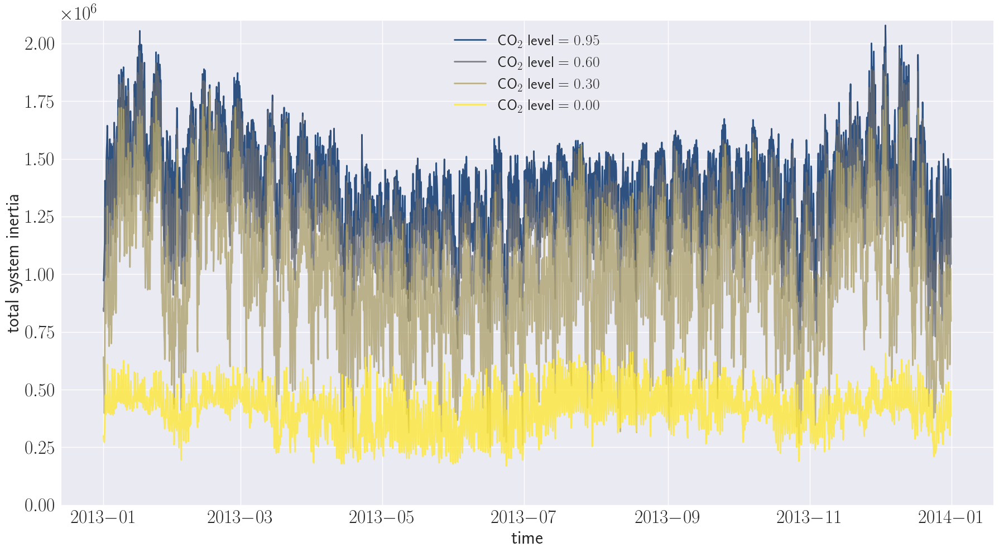

In [109]:
mpl.style.use('seaborn')
f,ax = plt.subplots(figsize=(18,10))
cmap = plt.get_cmap('cividis_r')

co2ls = np.arange(0.0,1.0,0.05)

for count,co2l in enumerate(current_co2ls[::-1]):
    
    ind = np.where(np.round(co2ls,2) == co2l)[0][0]

    ax.plot(network.snapshots,
            inertia_time[ind]*6,
            color = cmap(ind/len(co2ls)),
            lw = 2,
            alpha = 0.8,
            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2l)
    
ax.legend(fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_ylabel('total system inertia',fontsize = 24)
ax.set_xlabel('time',fontsize = 24)
ax.yaxis.offsetText.set_fontsize(24)
ax.set_ylim([0,3.5e5*6])
plt.tight_layout()
plt.savefig(save_path+'Figures/SI_Europe_Total_system_inertia_over_time.pdf',bbox_inches = 'tight')

plt.show()

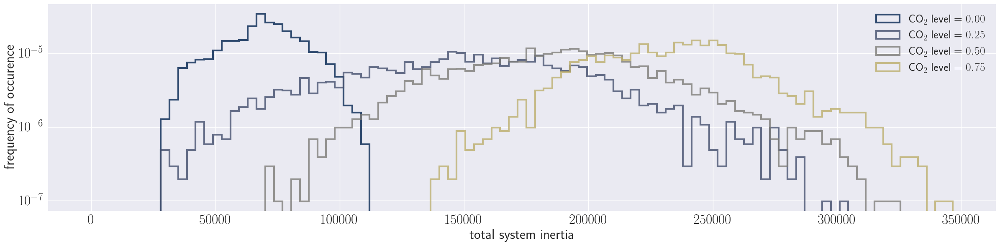

In [73]:
mpl.style.use('seaborn')

f,ax = plt.subplots(figsize=(24,6))
cmap = plt.get_cmap('cividis')
bins = np.arange(0,3.5e5,3.5e3)
for i in range(len(current_co2ls))[::5]:
    ax.hist(inertia_time[i],
                 bins = bins, 
                histtype='step',
                label = r'$\text{CO}_2\text{ level} = %.2f$'%current_co2ls[i],
                linewidth = 3,
            color = cmap(i/len(current_co2ls)),
                  density = True,
               alpha = 0.8)   
ax.legend(fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_xlabel('total system inertia',fontsize = 24)
ax.set_ylabel('frequency of occurence',fontsize = 24)
ax.set_yscale('log')
#ax.set_ylim([0,3.5e5])
plt.tight_layout()
#plt.savefig(save_path+'Europe_Total_system_inertia_over_time_hist.pdf',bbox_inches = 'tight')

plt.show()

In [11]:
snet_index = 0

level = 0.0

co2ls = np.arange(0.0,1.0,0.05)

network = pypsa.Network()
network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{np.round(level,2)}-3H.nc')  

G = utils.build_networkx_graph(network,snet_index = snet_index)

target_levels = [0.95,0.00]

inertia_generation = np.zeros((len(target_levels),2,len(G.nodes())))

for j,level in enumerate(target_levels):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]

    snet_index = 0

    network = pypsa.Network()
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{np.round(level,2)}-3H.nc') 

    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
    
    indices = np.argsort(inertia_time[ind])
    
    timestamps = [network.snapshots[indices[0]],
                  network.snapshots[indices[-1]]]
    
    load_shedding_indices = network.generators[network.generators.carrier.isin(['load'])].index
    
    for i,timestamp in enumerate(timestamps):
    
        current_generation = network.generators_t.p.loc[timestamp].copy()
        current_generation[load_shedding_indices] /= 1e3
        current_storage    = network.storage_units_t.p.loc[timestamp]
        
        for nodecount,node in enumerate(G.nodes()):
            subgraph = nx.Graph()
            subgraph.add_node(node)
            inertia_generation[j,i,nodecount] = utils.get_inertia_gen_subgraph(subgraph,
                                                              network.generators,
                                                              current_generation,
                                                              network.storage_units,
                                                              current_storage,
                                                               use_pnom = True)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

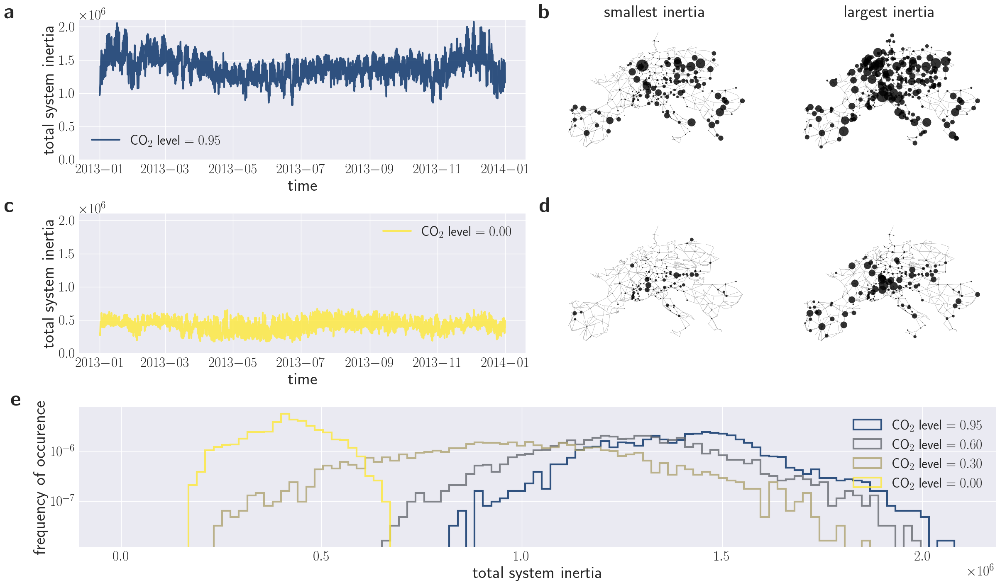

In [110]:
mpl.style.use('seaborn')

plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}\usepackage{bm}')

labels = [[r'\textbf{a}',r'\textbf{b}'],[r'\textbf{c}',r'\textbf{d}'],[r'\textbf{e}']]

f = plt.figure(figsize = (24,14),constrained_layout = True)

gs = GridSpec(3, 4, figure = f)

ax = f.add_subplot(gs[2, :])
ax2 = f.add_subplot(gs[0, :2])
ax3 = f.add_subplot(gs[1, :2])

ax21 = f.add_subplot(gs[0, 2])
ax22 = f.add_subplot(gs[0, 3])

ax31 = f.add_subplot(gs[1, 2])
ax32 = f.add_subplot(gs[1, 3])

axs = [[ax21,ax22],[ax31,ax32]]

current_co2ls = np.array([0.00,0.3,0.6,0.95])

##################### a )
cmap = plt.get_cmap('cividis_r')

bins = np.arange(0,2.1e6,2.1e4)

for count,level in enumerate(current_co2ls[::-1]):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]

    ax.hist(inertia_time[ind]*6,
                 bins = bins, 
                histtype='step',
                label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                linewidth = 3,
            color = cmap(ind/len(co2ls)),
                  density = True,
               alpha = 0.8)   
ax.xaxis.offsetText.set_fontsize(24)
    
ax.legend(fontsize = 24)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_xlabel('total system inertia',  fontsize = 30)
ax.set_ylabel('frequency of occurence',fontsize = 30)
ax.set_yscale('log')
#ax.set_ylim([0,3.5e5])

#####################################################

axes = [ax2,ax3]

for j,level in enumerate(target_levels):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]

    axes[j].plot(network.snapshots,
                 inertia_time[ind]*6,
            color = cmap(ind/len(co2ls)),
            lw = 3,
            alpha = 0.8,
            label = r'$\text{CO}_2\text{ level} = %.2f$'%level)
    axes[j].legend(fontsize = 24)
    axes[j].tick_params(axis = 'both', which = 'both', labelsize = 24)
    axes[j].set_ylabel('total system inertia',fontsize = 30)
    axes[j].set_xlabel('time',fontsize = 30)
    axes[j].set_ylim([0,2.1e6])
    axes[j].yaxis.offsetText.set_fontsize(24)

#ax3.plot(network.snapshots,inertia_time[target_levels[1]],
#            color = cmap(target_levels[1]/len(current_co2ls)),
#            lw = 3,
#            alpha = 0.8,
#            label = r'$\text{CO}_2\text{ level} = %.2f$'%current_co2ls[target_levels[1]])
#ax3.legend(fontsize = 24)
#ax3.tick_params(axis = 'both', which = 'both', labelsize = 24)
#ax3.set_ylabel('total system inertia',fontsize = 30)
#ax3.set_xlabel('time',fontsize = 30)
#ax3.set_ylim([0,3.5e5])

####################################################


titles = ['smallest inertia','largest inertia']

for j,level in enumerate(target_levels):
    
    
    for i in range(len(titles)):    
        nx.draw_networkx_nodes(G,
                pos,
                ax = axs[j][i],
                node_size = inertia_generation[j,i]/20, 
                alpha = 0.8,
                node_color = 'black')
        nx.draw_networkx_edges(G,
                pos,
                ax = axs[j][i],
                alpha = 0.8,
                width = 0.2)
        if j==0:
            axs[j][i].set_title(titles[i],fontsize = 30)
        axs[j][i].axis('off')
        
        #if i == 0:
        #    axs[j][i].text(0- 0.4, 0.5, 
        #                r'CO$_2$ = '+str(level),
        #                fontsize = 30,
        #                verticalalignment = 'center',
        #                transform = axs[j][i].transAxes)


ax3.text(0- 2.25*0.075, 1+0.05, 
        labels[1][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax3.transAxes)   

ax2.text(0- 2.25*0.075, 1+0.05, 
        labels[0][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax2.transAxes)            
 
ax31.text(0- 0.05, 1+0.05, 
        labels[1][1],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax31.transAxes)            
ax21.text(0- 0.05, 1+0.05, 
        labels[0][1],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax21.transAxes)     

#pos1 = ax32.get_position()
#pos2 = [pos1.x0*0.999, pos1.y0*1.001,pos1.width,pos1.height]
#ax32.set_position(pos2)

ax.text(0- 0.075, 1+0.05, 
        labels[2][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax.transAxes)
plt.savefig(save_path+'Figures/Figure2_total_system_inertia.pdf',bbox_inches = 'tight')
plt.show()

## Visualise inertia distribution

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

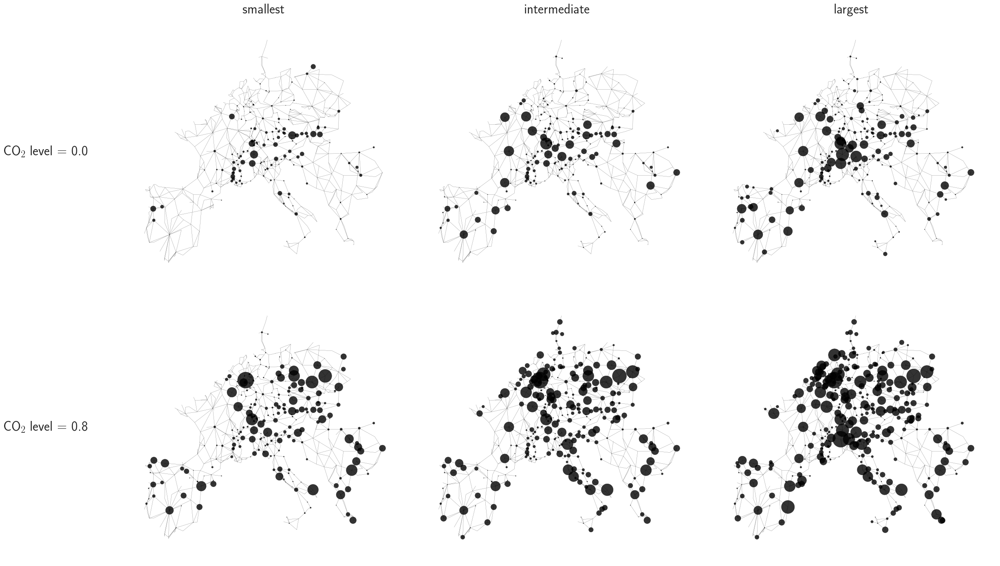

In [61]:
titles = ['smallest','intermediate','largest']
target_levels = [0,4]

inertia_generation = np.zeros((len(target_levels),len(timestamps),len(G.nodes())))


f,ax = plt.subplots(len(target_levels),3,figsize=(24,14))


for j in range(len(target_levels)):
    
    level = current_co2ls[target_levels[j]]

    snet_index = 0

    network = pypsa.Network()
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')  

    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
    
    indices = np.argsort(inertia_time[target_levels[j]])
    timestamps = [network.snapshots[indices[0]],
              network.snapshots[indices[int(len(network.snapshots)/2)]],
              network.snapshots[indices[-1]]]
    
    

    load_shedding_indices = network.generators[network.generators.carrier.isin(['load'])].index
    
    for i,timestamp in enumerate(timestamps):
    
        current_generation = network.generators_t.p.loc[timestamp].copy()
        current_generation[load_shedding_indices] /= 1e3
        current_storage    = network.storage_units_t.p.loc[timestamp]
        
        for nodecount,node in enumerate(G.nodes()):
            subgraph = nx.Graph()
            subgraph.add_node(node)
            inertia_generation[j,i,nodecount] = utils.get_inertia_gen_subgraph(subgraph,
                                                              network.generators,
                                                              current_generation,
                                                              network.storage_units,
                                                              current_storage,
                                                               use_pnom = True)
        
        
    for i in range(3):    
        nx.draw_networkx_nodes(G,
                pos,
                ax = ax[j,i],
                node_size = inertia_generation[j,i]/10, 
                alpha = 0.8,
                node_color = 'black')
        nx.draw_networkx_edges(G,
                pos,
                ax = ax[j,i],
                alpha = 0.8,
                width = 0.2)
        if j==0:
            ax[j,i].set_title(titles[i],fontsize = 24)
        ax[j,i].axis('off')
        if i == 0:
            ax[j,i].text(0- 0.4, 0.5, 
                        r'CO$_2$ level = '+str(current_co2ls[target_levels[j]]),
                        fontsize = 24,
                        verticalalignment = 'center',
                        transform = ax[j,i].transAxes)
plt.tight_layout()
#plt.savefig(save_path+'Heterogeneity_inertia_Europe.pdf',bbox_inches = 'tight')

plt.show()

In [63]:
normed_inertia_generation = np.zeros(inertia_generation.shape)
for i in range(inertia_generation.shape[0]):
    for j in range(inertia_generation.shape[1]):
        normed_inertia_generation[i,j,:] = inertia_generation[i,j]/np.mean(inertia_generation[i,j])

In [64]:
np.std(normed_inertia_generation,axis = 2)

array([[3.77228593, 3.70423162, 3.14369073],
       [3.14404459, 2.31109387, 1.94717091]])

## Get dipole Moment of generation mismatch

In [257]:
snet_index = 0

co2ls = np.arange(0.0,0.99,0.05)

#current_co2ls = co2ls#[0.0,0.1,0.2,0.3,0.4,0.5,0.6,0.7,0.8,0.9]#co2ls#

dipole_vector = np.zeros((len(co2ls),2,len(network.snapshots)))

mean_consumption_vector = np.zeros((len(co2ls),len(G.nodes())))
graph_net_mismatch = np.zeros((len(co2ls),len(network.snapshots)))

for i,level in enumerate(co2ls):
    
    network = pypsa.Network()
    level = np.round(level,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')  
    
    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
    
    ### NOTE: Here, the mean position is subtracted from the coordinates
    position_vector = np.array([pos[n] for n in G.nodes()])
    position_vector[:,1] -= np.mean(position_vector[:,1])
    position_vector[:,0] -= np.mean(position_vector[:,0])    

    #position_vector[:,0] /= np.max(position_vector[:,0])
    #position_vector[:,1] /= np.max(position_vector[:,1])
    #position_vector[:,1] -= np.mean(position_vector[:,1])
    #position_vector[:,0] -= np.mean(position_vector[:,0])
    
    nodal_balance = (network.generators_t.p.T.groupby(network.generators["bus"]).sum()-\
                    network.loads_t.p.T.groupby(network.loads["bus"]).sum()+\
                    network.storage_units_t.p.T.groupby(network.storage_units["bus"]).sum()).copy()
    
    ## add hvdc link subtraction/addition
    nodal_balance = nodal_balance.add(-network.links_t.p0.T.groupby(network.links["bus0"]).sum(), fill_value=0)
    nodal_balance = nodal_balance.add(-network.links_t.p1.T.groupby(network.links["bus1"]).sum(), fill_value=0)
    
    nodal_balance = -nodal_balance
    #total_gen = network.storage_units_t.p.T.sum()+network.generators_t.p.T.sum()
    # 
    #nodal_balance = nodal_balance/total_gen
    
    for nodecount,node in enumerate(G.nodes()):
        mean_consumption_vector[i,nodecount] = nodal_balance.mean(axis = 1).loc[node]
        graph_net_mismatch[i] += nodal_balance.loc[node]
        dipole_vector[i] += np.outer(position_vector[nodecount],nodal_balance.loc[node].to_numpy())
        

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.5-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

In [263]:
###
###
### To calculate the spatial power inhomogeneity (spi) we rescale the spi vector
### by the below scale factor, since it has the units of power and positions in long and lat
### We then evaluate the geodesic distance between the mean position (given in logitude and latitude)
### and the end point of the rescaled spi vector
###
###


co2ls = np.arange(0.0,0.99,0.05)



vec_norm = np.zeros((len(co2ls),len(network.snapshots)))
positions = np.array([pos[n] for n in G.nodes()])
mean_pos = np.array([np.mean(positions[:,0]),np.mean(positions[:,1])])
scale_factor = 5e4

k = gd.Geodesic() 

for i in range(len(co2ls)):
    for j in range((len(network.snapshots))):
        shapely_pos = Point(dipole_vector[i,:,j]/scale_factor+mean_pos)
        distance = k.inverse(shapely_pos, Point(mean_pos)).base[0,0]/1000
        vec_norm[i,j] = distance


In [23]:
#vec_norm = np.sqrt(dipole_vector[:,0,:]**2+dipole_vector[:,1,:]**2)

maximum_dipole_moment_indices = np.argmax(vec_norm,axis = 1)
minimum_dipole_moment_indices = np.argmin(vec_norm,axis = 1)

maximum_consumption_vector = np.zeros((len(current_co2ls),len(G.nodes())))
minimum_consumption_vector = np.zeros((len(current_co2ls),len(G.nodes())))

for i,level in enumerate(current_co2ls):
    network = pypsa.Network()
    level = np.round(level,2)
    network.import_from_netcdf(path_to_pypsa_network + f'elec_s_800_ec_lv1.0_Co2L{level}-3H.nc')  
    
    G = utils.build_networkx_graph(network,snet_index = snet_index)
    pos = nx.get_node_attributes(G,'pos')
    
    nodal_balance = (network.generators_t.p.T.groupby(network.generators["bus"]).sum()-\
                    network.loads_t.p.T.groupby(network.loads["bus"]).sum()+\
                    network.storage_units_t.p.T.groupby(network.storage_units["bus"]).sum()).copy()
    
    ## add hvdc link subtraction/addition
    nodal_balance = nodal_balance.add(-network.links_t.p0.T.groupby(network.links["bus0"]).sum(), fill_value=0)
    nodal_balance = nodal_balance.add(-network.links_t.p1.T.groupby(network.links["bus1"]).sum(), fill_value=0)
    
    for nodecount,node in enumerate(G.nodes()):
        maximum_consumption_vector[i,nodecount] = nodal_balance.loc[node][maximum_dipole_moment_indices[i]]
        minimum_consumption_vector[i,nodecount] = nodal_balance.loc[node][minimum_dipole_moment_indices[i]]

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

0 0
0 1
1 0
1 1


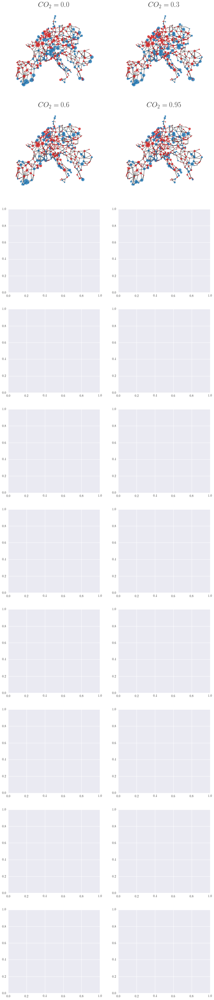

In [24]:
f,ax = plt.subplots(10,2,figsize=(12,60))

cmap = plt.get_cmap('cividis')

vec = maximum_consumption_vector#maximum_consumption_vector#mean_consumption_vector

for j,level in enumerate(current_co2ls):
    
    xcoord = int(j//2)
    ycoord = int(j%2)
    print(xcoord,ycoord)
    node_colours = ['tab:red' if vec[j,i]<0 else 'tab:blue' for i in range(len(G.nodes()))]
    
    nx.draw(G,
            pos,
            ax = ax[xcoord,ycoord],
            node_size = np.abs(vec[j])/30, 
            node_color = node_colours,
            alpha = 0.8 )
    level = np.round(level,2)
    ax[xcoord,ycoord].set_title(rf'$CO_2 = {level}$',fontsize = 24)
    
#plt.savefig(save_path+'distribution_load_generation_difference_dipole.pdf',bbox_inches = 'tight')


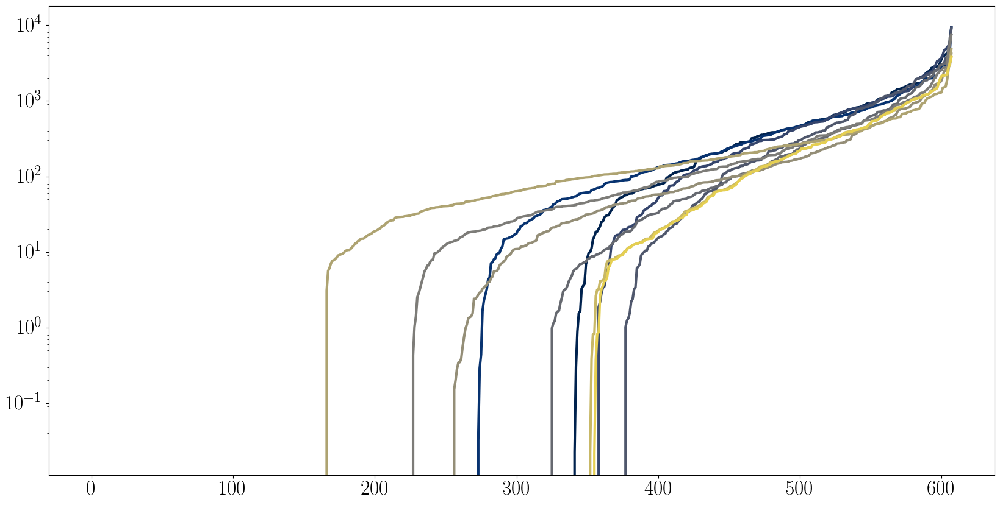

In [599]:
f,ax = plt.subplots(figsize=(20,10))

for j in range(len(current_co2ls))[::2]:
    vec = maximum_consumption_vector[j]-minimum_consumption_vector[j]
    indices = np.argsort(vec)
    ax.plot(np.arange(len(vec)),
               vec[indices],
               color = cmap(j/len(current_co2ls)),
           lw = 3)
    ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_yscale('log')
plt.show()
    

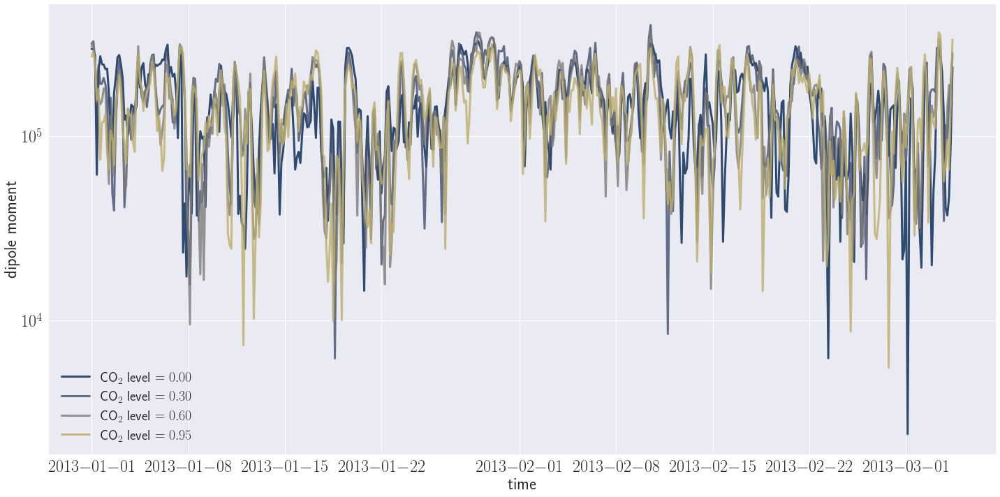

In [25]:
vec_norm = np.sqrt(dipole_vector[:,0,:]**2+dipole_vector[:,1,:]**2)

mpl.style.use('seaborn')
f,ax = plt.subplots(figsize=(20,10))
cmap = plt.get_cmap('cividis')
for i,co2l in enumerate(current_co2ls):
    ax.plot(network.snapshots[:500],vec_norm[i,:500],
            color =cmap(i/len(current_co2ls)),
            lw = 3,
            alpha = 0.8,
            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2l)
ax.legend(fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_ylabel('dipole moment',fontsize = 24)
ax.set_xlabel('time',fontsize = 24)
ax.set_yscale('log')

plt.tight_layout()
#plt.savefig(save_path+'Europe_Total_system_inertia_over_time.pdf',bbox_inches = 'tight')

plt.show()    

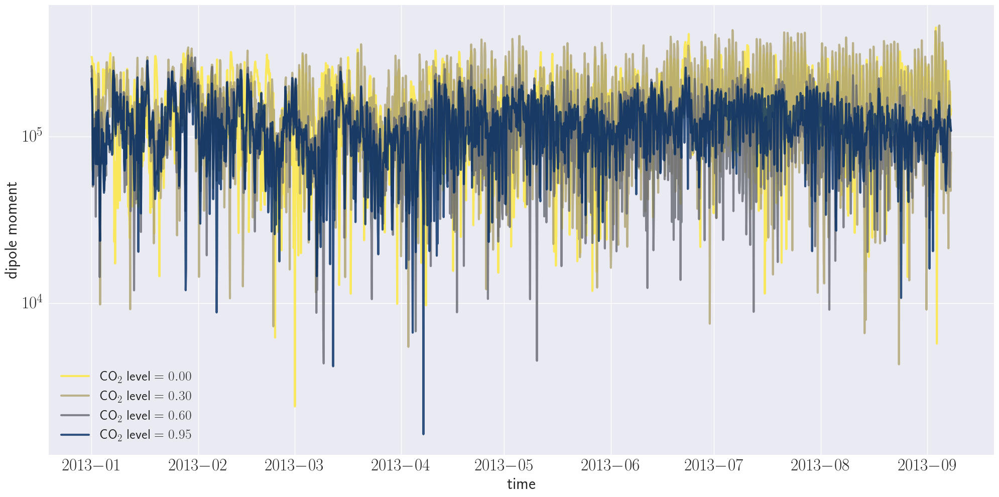

In [60]:
vec_norm = np.sqrt(dipole_vector[:,0,:]**2+dipole_vector[:,1,:]**2)

mpl.style.use('seaborn')
f,ax = plt.subplots(figsize=(20,10))
cmap = plt.get_cmap('cividis_r')

for i,co2l in enumerate(current_co2ls):
    ind = np.where(np.round(co2ls,2) == co2l)[0][0]

    ax.plot(network.snapshots[:2000],vec_norm[ind,:2000],
            color = cmap(ind/len(co2ls)),
            lw = 3,
            alpha = 0.8,
            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2l)
ax.legend(fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_ylabel('dipole moment',fontsize = 24)
ax.set_xlabel('time',fontsize = 24)
ax.set_yscale('log')

plt.tight_layout()
#plt.savefig(save_path+'Europe_Total_system_inertia_over_time.pdf',bbox_inches = 'tight')

plt.show()    

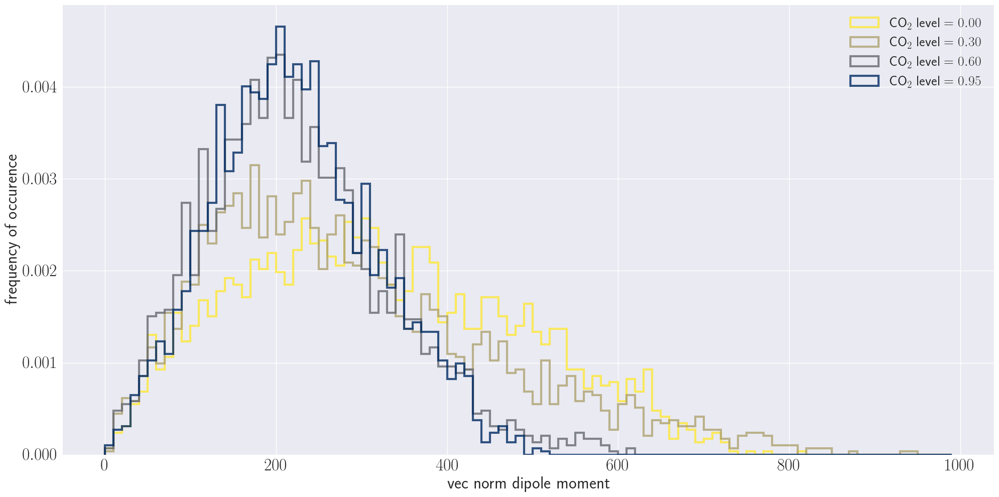

In [268]:

mpl.style.use('seaborn')

f,ax = plt.subplots(figsize=(20,10))
cmap = plt.get_cmap('cividis_r')
bins = np.arange(0,1e3,10)#np.arange(0,0.08,0.001)#

for i,co2l in enumerate(current_co2ls):
    ind = np.where(np.round(co2ls,2) == co2l)[0][0]
    ax.hist(vec_norm[ind],
                 bins = bins, 
                histtype='step',
                label = r'$\text{CO}_2\text{ level} = %.2f$'%co2l,
                linewidth = 3,
            color = cmap(ind/len(co2ls)),
                  density = True,
               alpha = 0.8)   
ax.legend(fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax.set_xlabel('vec norm dipole moment',fontsize = 24)
ax.set_ylabel('frequency of occurence',fontsize = 24)
#ax.set_yscale('log')
#ax.set_ylim([0,3.5e5])
plt.tight_layout()
#plt.savefig(save_path+'Dipole_moments_distibution.pdf',bbox_inches = 'tight')

plt.show()

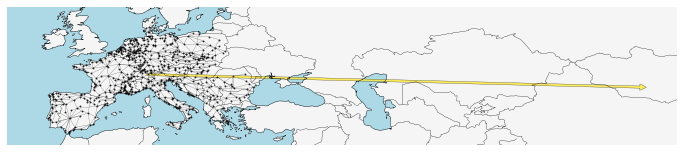

In [33]:
f,ax = plt.subplots(figsize=(12,10),subplot_kw={"projection":ccrs.PlateCarree()})
resolution = "50m"
color_geomap = {'ocean': 'lightblue', 'land': 'whitesmoke'}

ax.add_feature(cartopy.feature.LAND.with_scale(resolution),
                    facecolor = color_geomap['land'])
ax.add_feature(cartopy.feature.OCEAN.with_scale(resolution),
                    facecolor = color_geomap['ocean'])

ax.coastlines(linewidth = 0.4, zorder = 2, resolution=resolution)
border = cartopy.feature.BORDERS.with_scale(resolution)
ax.add_feature(border, linewidth=0.3)


steps = 5
cmap = plt.get_cmap('cividis_r')

position_vector = np.array([pos[n] for n in G.nodes()])
mean_pos = [np.mean(position_vector[:,0]),np.mean(position_vector[:,1])]

nx.draw_networkx_nodes(G,
                pos,
                ax = ax,
                alpha = 0.8,
                node_size = 2,
                node_color = 'black')

nx.draw_networkx_edges(G,
                pos,
                ax = ax,
                alpha = 0.8,
                width = 0.2)

for i,co2l in enumerate(current_co2ls[::steps]):
    current_vec = np.mean(dipole_vector,axis = 2)

    ax.arrow(mean_pos[0],
             mean_pos[1],
             current_vec[int(4*i),0]/750,
             current_vec[int(4*i),1]/750,
             head_width = 1.2,
             width = 0.4,
             head_length = 1.2,
             alpha  = .8,
             facecolor = cmap(i/len(current_co2ls[::steps])))
    ax.axis('off')
plt.show()

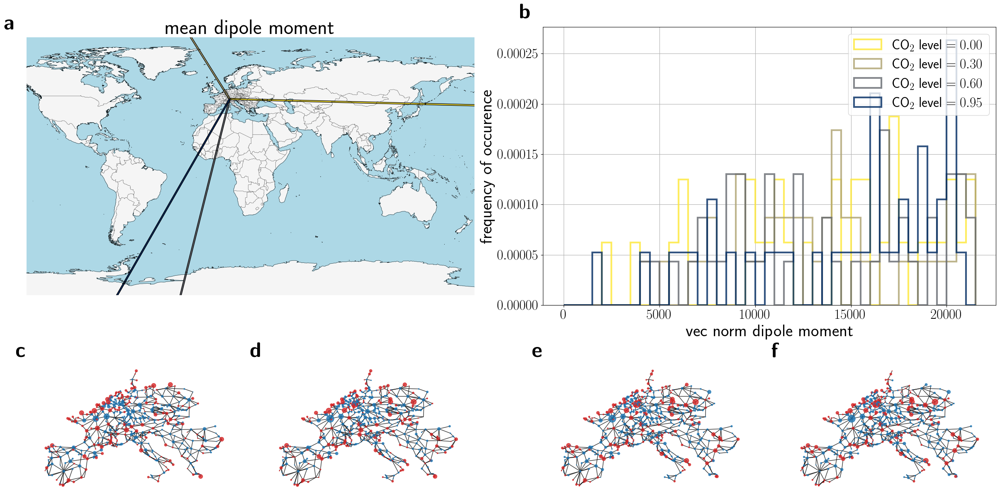

In [35]:
mpl.style.use('default')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

labels = [[r'\textbf{a}',r'\textbf{b}'],[r'\textbf{c}',r'\textbf{d}',r'\textbf{e}',r'\textbf{f}']]

f = plt.figure(figsize = (24,12),constrained_layout = True)

current_co2ls = np.array([0.00,0.3,0.6,0.95])

gs = GridSpec(3, 4, figure = f)

ax = f.add_subplot(gs[:2, :2],projection = ccrs.PlateCarree())
ax2 = f.add_subplot(gs[:2, 2:])

axs = [f.add_subplot(gs[2,i]) for i in range(4)]

###############################################

resolution = "50m"
color_geomap = {'ocean': 'lightblue', 'land': 'whitesmoke'}

ax.add_feature(cartopy.feature.LAND.with_scale(resolution),
                    facecolor = color_geomap['land'])
ax.add_feature(cartopy.feature.OCEAN.with_scale(resolution),
                    facecolor = color_geomap['ocean'])

ax.coastlines(linewidth = 0.4, zorder = 2, resolution=resolution)
border = cartopy.feature.BORDERS.with_scale(resolution)
ax.add_feature(border, linewidth=0.3)


cmap = plt.get_cmap('cividis_r')

position_vector = np.array([pos[n] for n in G.nodes()])
mean_pos = [np.mean(position_vector[:,0]),np.mean(position_vector[:,1])]

nx.draw_networkx_nodes(G,
                pos,
                ax = ax,
                alpha = 0.8,
                node_size = 0,
                node_color = 'black')

nx.draw_networkx_edges(G,
                pos,
                ax = ax,
                alpha = 0.8,
                width = 0.2)

current_vec = np.mean(dipole_vector,axis = 2)

for i,level in enumerate(current_co2ls):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]

    ax.arrow(mean_pos[0],
             mean_pos[1],
             current_vec[ind,0]/300,
             current_vec[ind,1]/300,
             head_width = 2.0,
             width = 1.0,
             head_length = 2.0,
             #alpha  = .8,
             facecolor = cmap(ind/len(co2ls)))
    ax.axis('off')


##################### a )
bins = np.arange(0,2.2e4,500)#np.arange(0,0.08,0.001)#

for i,level in enumerate(current_co2ls):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]
    ax2.hist(vec_norm[ind],
                bins = bins, 
                histtype='step',
                label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                linewidth = 3,
                color = cmap(ind/len(co2ls)),
                density = True,
                alpha = 0.8)   
ax2.legend(fontsize = 24)
ax2.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax2.set_xlabel('vec norm dipole moment',fontsize = 30)
ax2.set_ylabel('frequency of occurence',fontsize = 30)
ax2.grid(True)

#####################################################

vec = mean_consumption_vector

for j,level in enumerate(current_co2ls):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]
    
    node_colours = ['tab:red' if vec[ind,i]<0 else 'tab:blue' for i in range(len(G.nodes()))]
    
    nx.draw(G,
            pos,
            ax = axs[j],
            node_size = np.abs(vec[ind])/50, 
            node_color = node_colours,
            alpha = 0.8 )
    level = np.round(level,2)
    #axs[j].set_title(rf'$CO_2 = {co2l}$',fontsize = 24)
    axs[j].text(-0.05, 1+0.05, 
        labels[1][j],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = axs[j].transAxes)      


####################################################

ax2.text(-0.05, 1+0.05, 
        labels[0][1],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax2.transAxes)

ax.text(-0.05, 1+0.05, 
        labels[0][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax.transAxes)      

ax.set_title('mean dipole moment', fontsize  = 36) 
#plt.savefig(save_path+'Figures/Figure3_inital_grid_situation.pdf',bbox_inches = 'tight')
plt.show()

(41.051046988549416, 47.68756818722694)
(41.4485090120224, 48.9696952902116)
(40.67394786827379, 50.18618133418294)
(37.335664257063726, 54.63045293603969)
(36.22887518891165, 56.1072657660602)
(35.34995364286714, 56.65989229580092)
(34.97032445390552, 59.34754591227638)
(37.35352814318596, 60.29928495567561)
(39.083729914002106, 56.22418136075561)
(35.586282041172986, 47.87986248481911)
(37.55202042412624, 47.718696253366126)
(31.707498915424157, 47.925891240294035)


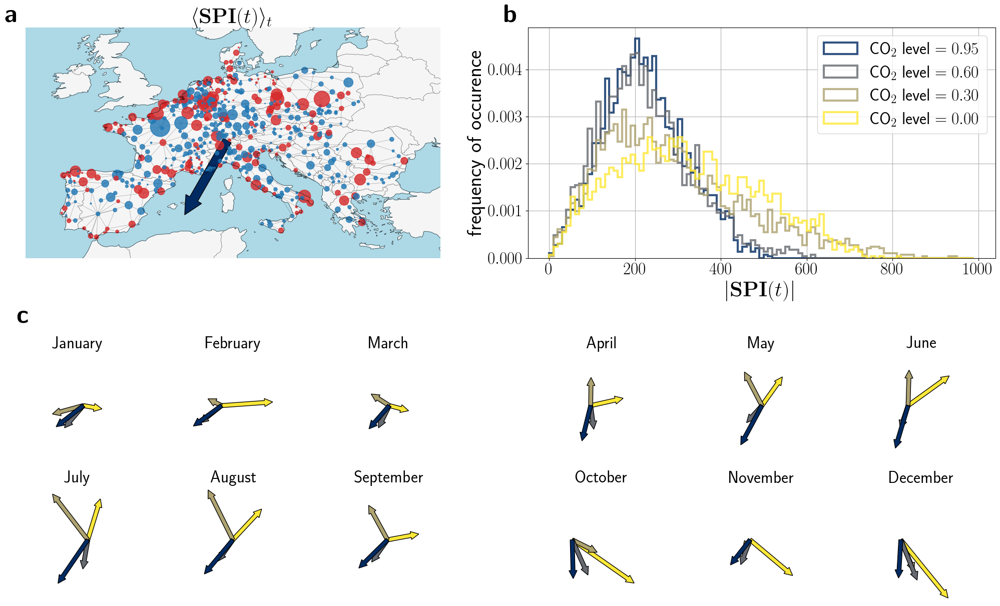

In [271]:
mpl.style.use('default')
plt.rc('text', usetex = True)
plt.rc('text.latex', preamble=r'\usepackage{amsmath}')

labels = [[r'\textbf{a}',r'\textbf{b}'],[r'\textbf{c}',r'\textbf{d}',r'\textbf{e}',r'\textbf{f}']]

f = plt.figure(figsize = (20,12),constrained_layout = True)

current_co2ls = np.array([0.00,0.3,0.6,0.95])

gs = GridSpec(4, 6, figure = f)

ax = f.add_subplot(gs[:2, :3],projection = ccrs.PlateCarree())
ax2 = f.add_subplot(gs[:2, 3:])

axs = [f.add_subplot(gs[2,i],projection = ccrs.PlateCarree()) for i in range(6)]
axs2 = [f.add_subplot(gs[3,i],projection = ccrs.PlateCarree()) for i in range(6)]
axs_both = [axs,axs2]
###############################################

resolution = "50m"
color_geomap = {'ocean': 'lightblue', 'land': 'whitesmoke'}

ax.add_feature(cartopy.feature.LAND.with_scale(resolution),
                    facecolor = color_geomap['land'])
ax.add_feature(cartopy.feature.OCEAN.with_scale(resolution),
                    facecolor = color_geomap['ocean'])

ax.coastlines(linewidth = 0.4, zorder = 2, resolution=resolution)
border = cartopy.feature.BORDERS.with_scale(resolution)
ax.add_feature(border, linewidth=0.3)


cmap = plt.get_cmap('cividis_r')

position_vector = np.array([pos[n] for n in G.nodes()])
mean_pos = [np.mean(position_vector[:,0]),np.mean(position_vector[:,1])]


nx.draw_networkx_edges(G,
                pos,
                ax = ax,
                alpha = 0.8,
                width = 0.2)

scale_factor = 1e4

current_vec = np.mean(dipole_vector,axis = 2)
vec = mean_consumption_vector

plot_co2ls = [0.95]

for i,level in enumerate(plot_co2ls):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]
    
    node_colours = ['tab:red' if vec[ind,i]<0 else 'tab:blue' for i in range(len(G.nodes()))]
    
    nx.draw_networkx_nodes(G,
            pos,
            ax = ax,
            node_size = np.abs(vec[ind])/10, 
            node_color = node_colours,
            alpha = 0.8 )
    
    ax.arrow(mean_pos[0],
             mean_pos[1],
             current_vec[ind,0]/scale_factor,
             current_vec[ind,1]/scale_factor,
             head_width = 2.0,
             width = 1.0,
             head_length = 2.0,
             #alpha  = .8,
             facecolor = cmap(ind/len(co2ls)))
    ax.axis('off')


##################### a )
#bins = np.arange(0,5e5,5000)
bins = np.arange(0,1e3,10)#np.arange(0,0.08,0.001)#

for i,level in enumerate(current_co2ls[::-1]):
    
    ind = np.where(np.round(co2ls,2) == level)[0][0]
    ax2.hist(vec_norm[ind],
                bins = bins, 
                histtype='step',
                label = r'$\text{CO}_2\text{ level} = %.2f$'%level,
                linewidth = 3,
                color = cmap(ind/len(co2ls)),
                density = True,
                alpha = 0.8)   
ax2.legend(fontsize = 24)
ax2.tick_params(axis = 'both', which = 'both', labelsize = 24)
ax2.set_xlabel(r'$|\mathbf{SPI}(t)|$',fontsize = 30)
ax2.set_ylabel('frequency of occurence',fontsize = 30)
ax2.grid(True)
ax2.yaxis.offsetText.set_fontsize(24)

#####################################################
old_ind = 0

for j in range(12):
    
    xcoord = int(j//6)
    ycoord = int(j%6)
    
    new_ind = old_ind + len(network.snapshots[network.snapshots.month == int(j+1)])

    current_vec = np.mean(dipole_vector[:,:,old_ind:new_ind],axis = 2)

    for i,level in enumerate(current_co2ls):
        ind = np.where(np.round(co2ls,2) == level)[0][0]
    
        axs_both[xcoord][ycoord].arrow(mean_pos[0],
                 mean_pos[1],
                 current_vec[ind,0]/scale_factor,
                 current_vec[ind,1]/scale_factor,
                 head_width = 2.0,
                 width = 1.0,
                 head_length = 2.0,
                 #alpha  = .8,
                 facecolor = cmap(ind/len(co2ls)))
    axs_both[xcoord][ycoord].axis('off')
    lims = axs_both[xcoord][ycoord].get_ylim()
    axs_both[xcoord][ycoord].set_ylim([31.707498915424157,60.29928495567561])
    print(lims)
    
    
    old_ind = new_ind

    #if xcoord == 0:
    #    pos1 = axs_both[xcoord][ycoord].get_position()
    #    pos2 = [pos1.x0, pos1.y0,pos1.width,pos1.height]
    #    axs_both[xcoord][ycoord].set_position(pos2)
####################################################

ax2.text(-0.05, 1+0.05, 
        labels[0][1],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax2.transAxes)

ax.text(-0.05, 1+0.05, 
        labels[0][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = ax.transAxes)    

axs_both[0][0].text(-0.6, 1+0.3, 
        labels[1][0],
        fontsize = 36,
        weight = 'bold',
        verticalalignment = 'center',
        transform = axs_both[0][0].transAxes)      

ax.set_title(r'$\langle \mathbf{SPI}(t)\rangle_t$', fontsize  = 30) 


for j in range(12):
    xcoord = int(j//6)
    ycoord = int(j%6)   
    axs_both[xcoord][ycoord].set_title(network.snapshots[network.snapshots.month == j+1][0].month_name(),
                                       fontsize = 24,
                                      pad = -500)

plt.savefig(save_path+'Figures/Figure3_inital_grid_situation.pdf',bbox_inches = 'tight')
plt.show()

ValueError: x and y must have same first dimension, but have shapes (4,) and (20,)

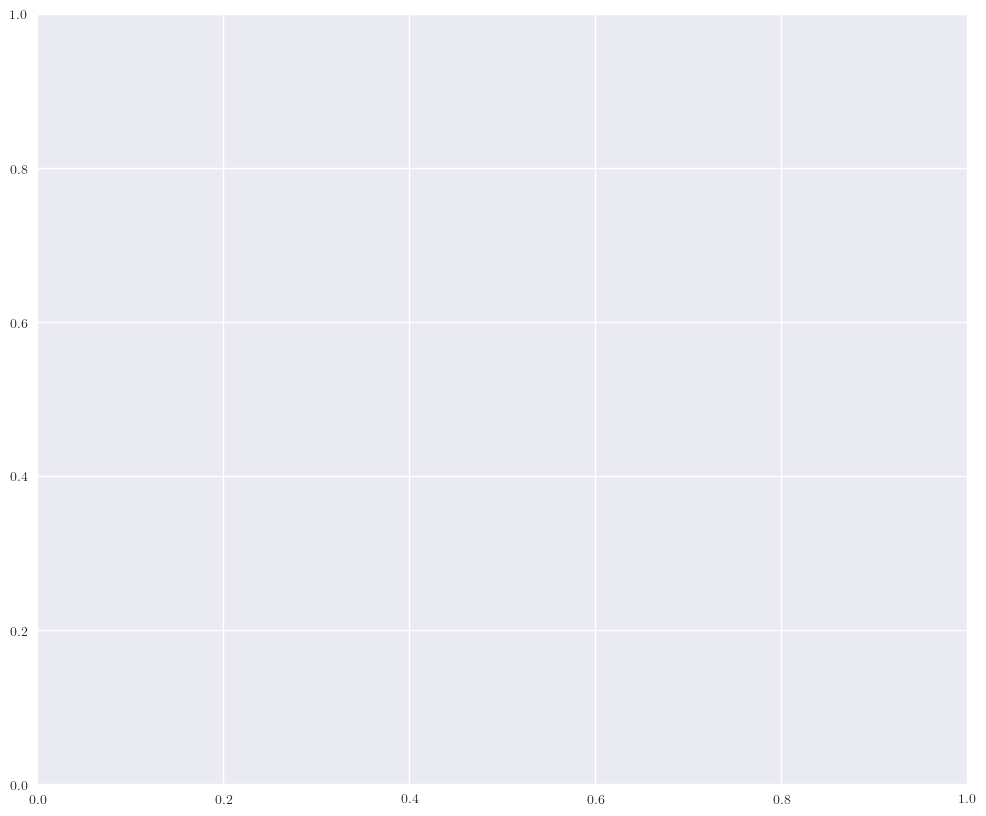

In [247]:
means = np.median(vec_norm,axis = 1)
upper_quantile = np.quantile(vec_norm,0.75,axis=1)
lower_quantile = np.quantile(vec_norm,0.25,axis=1)

f,ax = plt.subplots(figsize=(12,10))
ax.plot(current_co2ls,means,lw = 3)
ax.fill_between(current_co2ls,means,upper_quantile,alpha = 0.5,color = 'C0')
ax.fill_between(current_co2ls,means,lower_quantile,alpha = 0.5,color = 'C0')
ax.set_ylabel('vec norm dipole moment',fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 20)
ax.set_xlabel('CO2 level',fontsize = 20)
#plt.savefig(save_path+'Dipole_moments_quantiles.pdf',bbox_inches = 'tight')
ax.set_ylim([0,9000])
plt.show()

0 248
(33.932369015000006, 59.335419984999994)
248 472
(33.932369015000006, 59.335419984999994)
472 720
(33.932369015000006, 59.335419984999994)
720 960
(33.85801970099238, 60.896755579160036)
960 1208
(33.1976624182, 62.80564286829195)
1208 1448
(32.62164387031574, 63.98712702596972)
1448 1696
(27.817553279574557, 64.94945587461946)
1696 1944
(26.550160834803798, 61.28813476652321)
1944 2184
(32.93559100723261, 59.382885604417496)
2184 2432
(33.6587278149076, 65.08188518694053)
2432 2672
(33.8131116036182, 61.839825624017884)
2672 2920
(33.38439425904756, 70.8428898600013)


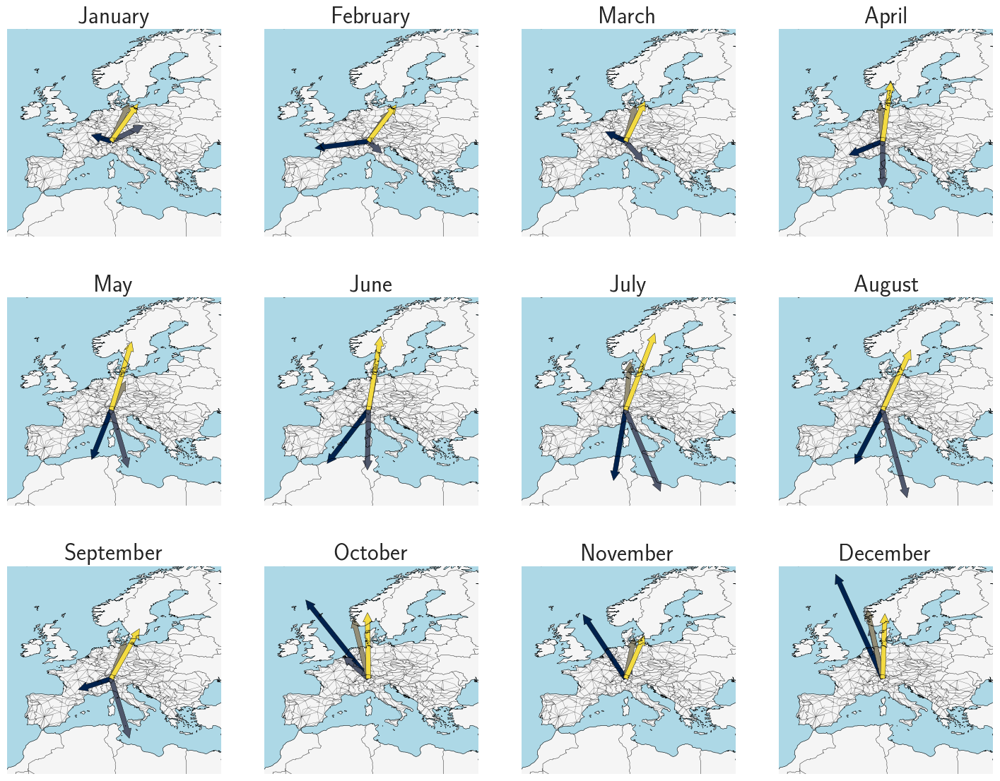

In [794]:
f,ax = plt.subplots(3,4,
                    figsize = (18,14),
                    subplot_kw = {'projection': ccrs.PlateCarree()})

resolution = "50m"
color_geomap = {'ocean': 'lightblue', 'land': 'whitesmoke'}

old_ind = 0

for j in range(12):
    
    xcoord = int(j//4)
    ycoord = int(j%4)
    
    new_ind = old_ind + len(network.snapshots[network.snapshots.month == int(j+1)])
    print(old_ind,new_ind)
    current_vec = np.mean(dipole_vector[:,:,old_ind:new_ind],axis = 2)

    for i,level in enumerate(current_co2ls):
        ind = np.where(np.round(co2ls,2) == level)[0][0]
    
        ax[xcoord,ycoord].arrow(mean_pos[0],
                 mean_pos[1],
                 current_vec[ind,0]/300,
                 current_vec[ind,1]/300,
                 head_width = 2.0,
                 width = 1.0,
                 head_length = 2.0,
                 #alpha  = .8,
                 facecolor = cmap(ind/len(co2ls)))
    ax[xcoord,ycoord].add_feature(cartopy.feature.LAND.with_scale(resolution),
                    facecolor = color_geomap['land'])
    ax[xcoord,ycoord].add_feature(cartopy.feature.OCEAN.with_scale(resolution),
                        facecolor = color_geomap['ocean'])
    
    ax[xcoord,ycoord].coastlines(linewidth = 0.4, zorder = 2, resolution=resolution)
    border = cartopy.feature.BORDERS.with_scale(resolution)
    ax[xcoord,ycoord].add_feature(border, linewidth=0.3)
    
    
    cmap = plt.get_cmap('cividis')
    
    position_vector = np.array([pos[n] for n in G.nodes()])
    mean_pos = [np.mean(position_vector[:,0]),np.mean(position_vector[:,1])]
    
    nx.draw_networkx_nodes(G,
                    pos,
                    ax = ax[xcoord,ycoord],
                    alpha = 0.8,
                    node_size = 0,
                    node_color = 'black')
    
    nx.draw_networkx_edges(G,
                    pos,
                    ax = ax[xcoord,ycoord],
                    alpha = 0.8,
                    width = 0.2)    
            
            
    
    ax[xcoord,ycoord].axis('off')
    
    ax[xcoord,ycoord].set_title(network.snapshots[old_ind].month_name(),fontsize = 24)
    lims = ax[xcoord,ycoord].get_ylim()
    ax[xcoord,ycoord].set_ylim([26.550160834803798,70.8428898600013])
    print(lims)
    old_ind = new_ind
#plt.savefig(save_path+'Figures/SI_monthly_dipole_vectors.png',bbox_inches = 'tight')

plt.show()

(33.45827014524533, 69.29149624984814)
(33.56539471467493, 67.04188029182656)
(33.932369015000006, 59.335419984999994)
(13.727188987886404, 60.29757141486255)
(18.049719371232683, 60.0917366347032)
(33.932369015000006, 59.335419984999994)
(33.69908748192035, 64.23433217967263)
(33.47658433562416, 68.90689825189276)


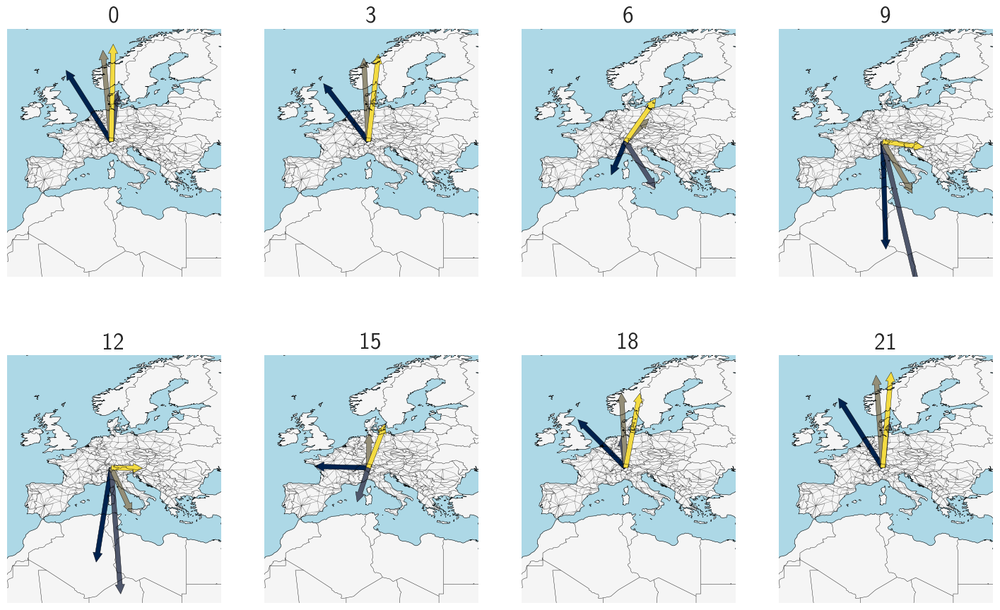

In [817]:
f,ax = plt.subplots(2,4,
                    figsize = (18,11),
                    subplot_kw = {'projection': ccrs.PlateCarree()})

resolution = "50m"
color_geomap = {'ocean': 'lightblue', 'land': 'whitesmoke'}

old_ind = 0

for j in range(8):
    
    xcoord = int(j//4)
    ycoord = int(j%4)
    
    current_vec = np.mean(dipole_vector[:,:,network.snapshots.hour == 3*int(j)],axis = 2)

    for i,level in enumerate(current_co2ls):
        ind = np.where(np.round(co2ls,2) == level)[0][0]
    
        ax[xcoord,ycoord].arrow(mean_pos[0],
                 mean_pos[1],
                 current_vec[ind,0]/300,
                 current_vec[ind,1]/300,
                 head_width = 2.0,
                 width = 1.0,
                 head_length = 2.0,
                 #alpha  = .8,
                 facecolor = cmap(ind/len(co2ls)))
    ax[xcoord,ycoord].add_feature(cartopy.feature.LAND.with_scale(resolution),
                    facecolor = color_geomap['land'])
    ax[xcoord,ycoord].add_feature(cartopy.feature.OCEAN.with_scale(resolution),
                        facecolor = color_geomap['ocean'])
    
    ax[xcoord,ycoord].coastlines(linewidth = 0.4, zorder = 2, resolution=resolution)
    border = cartopy.feature.BORDERS.with_scale(resolution)
    ax[xcoord,ycoord].add_feature(border, linewidth=0.3)
    
    
    cmap = plt.get_cmap('cividis')
    
    position_vector = np.array([pos[n] for n in G.nodes()])
    mean_pos = [np.mean(position_vector[:,0]),np.mean(position_vector[:,1])]
    
    nx.draw_networkx_nodes(G,
                    pos,
                    ax = ax[xcoord,ycoord],
                    alpha = 0.8,
                    node_size = 0,
                    node_color = 'black')
    
    nx.draw_networkx_edges(G,
                    pos,
                    ax = ax[xcoord,ycoord],
                    alpha = 0.8,
                    width = 0.2)    
            
            
    
    ax[xcoord,ycoord].axis('off')
    
    ax[xcoord,ycoord].set_title(3*int(j),fontsize = 24)
    lims = ax[xcoord,ycoord].get_ylim()
    ax[xcoord,ycoord].set_ylim([18.049719371232683,70.8428898600013])
    print(lims)
#plt.savefig(save_path+'Figures/SI_monthly_dipole_vectors.png',bbox_inches = 'tight')

plt.show()

## Test correlation dipole and split probability

In [214]:
vec_norm = np.sqrt(dipole_vector[:,0,:]**2+dipole_vector[:,1,:]**2)

In [198]:
bridges = list(nx.bridges(nx.Graph(G)))
non_bridges = list(set(list(G.edges())) - set(bridges))

probability_split = np.zeros((len(current_co2ls),len(network.snapshots)))

for i,level in enumerate(current_co2ls):

    current_level = np.round(level,2)
    solution_dict = pickle.load(open(results_path+f'Europe_Co2L{current_level}_split_evaluation_'+criterion+'_based_snet_%i'%snet_index+'.pickle','rb'))

    for count,snapshot in enumerate(network.snapshots):
        probability_split[i,count] = len(solution_dict[utils.pandas_timestamp_to_solution_key(snapshot)])/2/len(non_bridges)

In [259]:
#plt.plot(np.arange(len(probability_split[0]))[:500],probability_split[0][:500])
#plt.plot(np.arange(len(probability_split[-1]))[:500],probability_split[-1][:500])

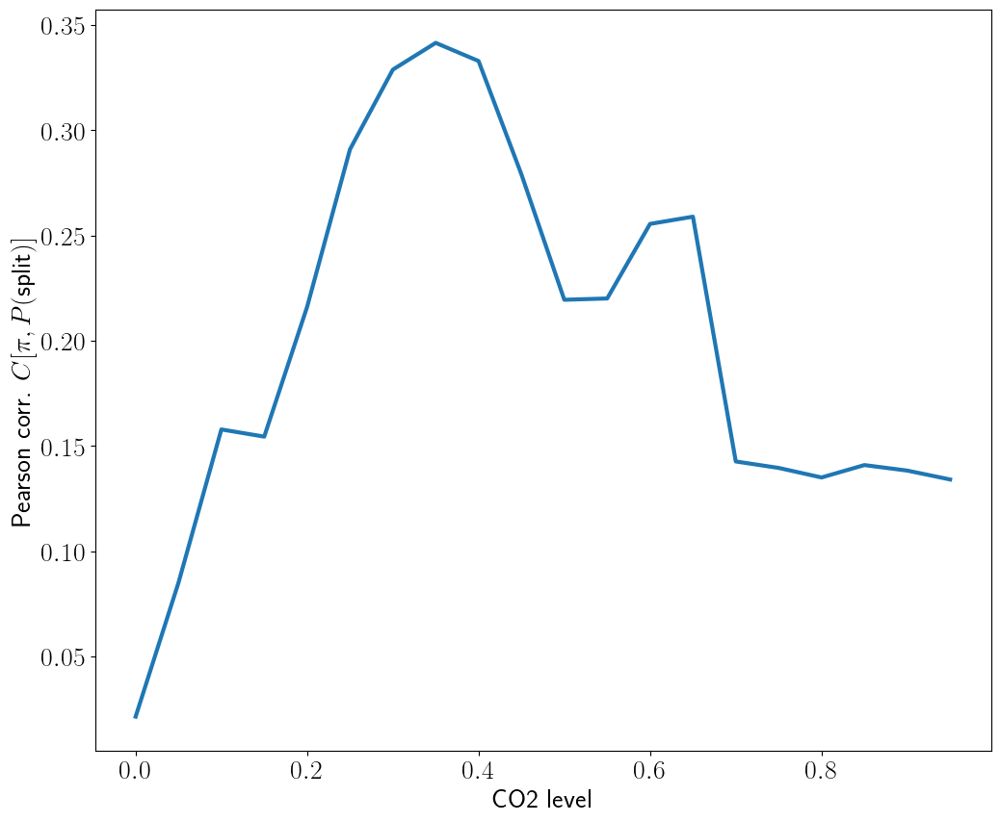

In [475]:
f,ax = plt.subplots(figsize=(12,10))
ax.plot(current_co2ls,[np.corrcoef(vec_norm[i],probability_split[i])[0,1] for i in range(len(current_co2ls))],lw = 3) 
ax.set_ylabel(r'Pearson corr. $C[\pi,P(\text{split})]$',fontsize = 20)
ax.tick_params(axis = 'both', which = 'both', labelsize = 20)
ax.set_xlabel('CO2 level',fontsize = 20)
#plt.savefig(save_path+'Pearson_correlation_coefficient_dipole_split.pdf',bbox_inches = 'tight')
plt.show()



## Check out line flows

In [112]:
bins = np.arange(0,1.0,0.02)


co2ls = np.arange(0.0,1.0,0.2)

hist_vals = np.zeros((len(co2ls),len(bins)-1))

current_co2ls = np.array([0.00,0.3,0.6,0.95])


for count,co2l in enumerate(current_co2ls):

    path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
    results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'
    
    network = pypsa.Network()
    currentlevel = np.round(co2l,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc')

    snet_index = 0
    
    G = utils.build_networkx_graph(network, snet_index = snet_index)
    
    indices = nx.get_edge_attributes(G, 'line_index')
    line_limits = nx.get_edge_attributes(G, 's_nom')
    
    for e, index_list in tqdm(indices.items()):
        loadings = np.abs(network.lines_t.p0.T.loc[index_list[0]]/line_limits[e])
        current_hist = np.histogram(loadings,bins)[0]
        hist_vals[count] += current_hist
    # for e, index_list in indices.items()}

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
100%|██████████| 1008/1008 [00:00<00:00, 1516.01it/s]
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as

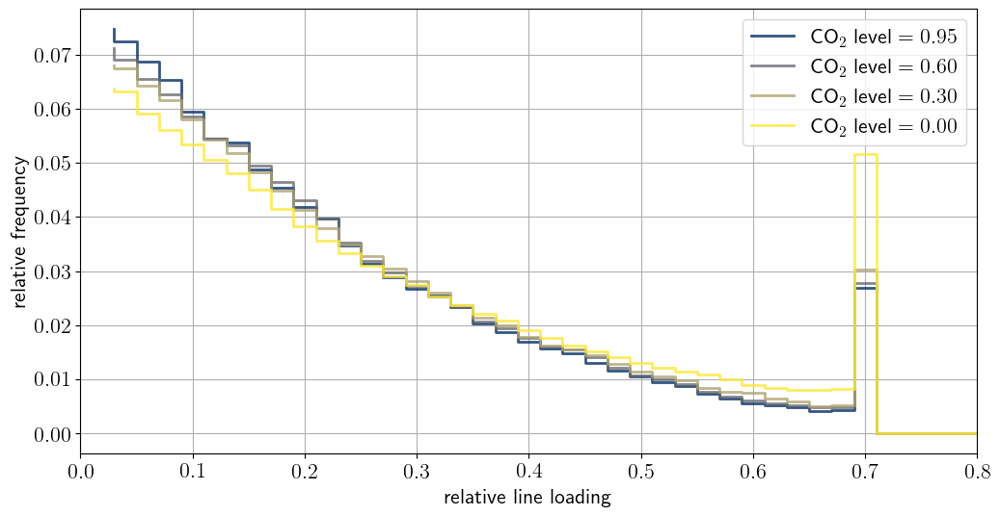

In [114]:
xpoints = (bins +(bins[1]-bins[0])/2)[1:]

co2ls = np.arange(0.0,1.0,0.05)

f,ax = plt.subplots(figsize = (12,6))

for count,co2l in enumerate(current_co2ls[::-1]):
    
    ind = np.where(np.round(co2ls,2) == co2l)[0][0]
    
    ax.step(xpoints,
          hist_vals[3-count]/np.sum(hist_vals[3-count]),
            label = r'$\text{CO}_2\text{ level} = %.2f$'%co2l,
            linewidth = 2,
            color = cmap(ind/len(co2ls)),
            alpha = 0.8)   
ax.legend(fontsize = 16)
          #width = (bins[1]-bins[0])/2,
             #label = 'data')
ax.set_xlim([0,0.8])
ax.tick_params(axis = 'both', which = 'both', labelsize = 16)
ax.set_xlabel(r'relative line loading', fontsize = 16)
ax.set_ylabel(r'relative frequency', fontsize = 16)
ax.grid(True)
#ax.set_yscale('log')
#ax.set_ylim([4e-3,1e-1])
plt.savefig(save_path+'Figures/SI_line_utilization_versus_CO2.pdf',bbox_inches = 'tight')

plt.show()

In [325]:
objectives = []
for count,co2l in enumerate(co2ls):

    path_to_pypsa_network   = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/'
    results_path = path + 'Data/system_split/European_Networks/New_networks_CO2_levels/Results/'
    
    network = pypsa.Network()
    currentlevel = np.round(co2l,2)
    network.import_from_netcdf(path_to_pypsa_network+f'elec_s_800_ec_lv1.0_Co2L{currentlevel}-3H.nc')
    objectives.append(network.objective)

/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=df.index | columns, fill_value=default)
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:771: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this will be a logical operation matching Series.__or__.  Use index.union(other) instead
  pnl[attr] = pnl[attr].reindex(columns=(pnl[attr].columns | columns))
INFO:pypsa.io:Imported network elec_s_800_ec_lv1.0_Co2L0.0-3H.nc has buses, carriers, generators, global_constraints, lines, links, loads, storage_units
/home/fkaiser/.conda/envs/system_split/lib/python3.9/site-packages/pypsa/io.py:769: FutureWarning: Index.__or__ operating as a set operation is deprecated, in the future this wil

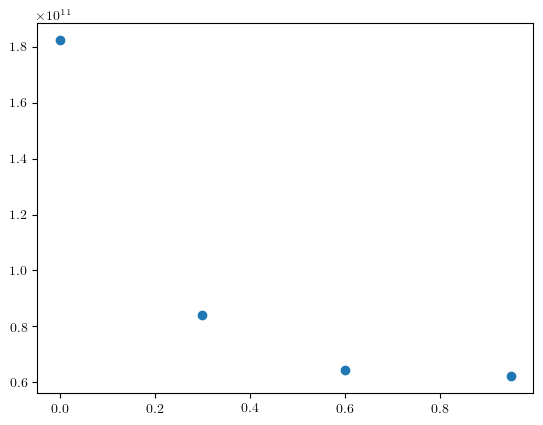

In [326]:
plt.scatter(co2ls,objectives)